In [1]:
# Import all essential libraries

import os
import csv
import math
import warnings
import random
import numpy as np
import networkx as nx
import scipy.constants as sc
import matplotlib.pyplot as plt
import networkx.algorithms.isomorphism as iso
# %matplotlib qt
from IPython.core.debugger import Pdb
ipdb = Pdb()

In [2]:
def plot_fig(G, title=""):
    A = nx.adjacency_matrix(G)
    pos = nx.spring_layout(G)
    nodes = list(nx.nodes(G))
    mapping = {}
    for i,j in enumerate(nodes):
        mapping[j] = i
        
    plt.figure()
    if title: plt.title(title)
    for i in G.edges():
        G[i[0]][i[1]][0]['number'] = A[mapping[i[0]], mapping[i[1]]]
    labels = nx.get_edge_attributes(G, 'number')
    edge_labels = {}
    for i in labels:
        edge_labels[(i[0], i[1])] = labels[i]
    nx.draw(G, pos, with_labels=True,edge_color='black',width=1,linewidths=1,node_size = 500,node_color='pink',alpha=0.9)
    nx.draw_networkx_edge_labels(G, pos, edge_labels = edge_labels)
    plt.show()

In [3]:
class Atom():
    def __init__(self, name, number):
        self._name = name + " " + str(number)
        self._number = number
        self._element = name
        self._valency = self.get_max_valency()

    def get_max_valency(self):
        name = self._element[0]
        if name == "H":
            return 1
        elif name == "C":
            return 4
        elif name == "N":
            return 3
        elif name == "O":
            return 2
        elif name == "S":
            return 2

    def current_valency(self, G):
        neig = nx.degree(G, self)
        max_val = self.get_max_valency()
        if neig > max_val:
            ipdb.set_trace()
            raise ValueError('Atom has more neighbours than valence')
        else:
            # print(max_val, neig)
            self._valency = max_val - neig
        
    def get_total_valency(self, G):
        neig = nx.degree(G, self)
        free_electrons = self.get_max_valency() - neig
        return free_electrons
        
        
    def __repr__(self):
        return self._name

In [4]:
# Defining the atom list in the Graph

H_list = [Atom("H", i) for i in range(1,33)]
C_list = [Atom("C", i) for i in range(33, 41)]
O_list = [Atom("O", i) for i in range(41, 49)]
N_list = [Atom("N", i) for i in range(49, 57)]

complete_list = [];
for lst in [H_list, C_list, O_list, N_list]:
    complete_list.extend(lst)

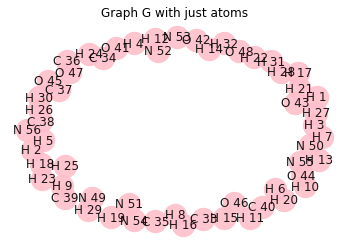

In [5]:
# Creating the graph with just atoms
# MultiGraph is being used for ease of representing
# double and possible triple bonds
# Here, 
#    - lst loops through the lists (H, C, O and N)
#    - comp loops over the compounds

G = nx.MultiGraph()
for i,lst in enumerate([H_list, C_list, O_list, N_list]):
    for comp in lst:
        G.add_node(comp, data=comp)
plot_fig(G, "Graph G with just atoms")

In [6]:
nx.nodes(G)

NodeView((H 1, H 2, H 3, H 4, H 5, H 6, H 7, H 8, H 9, H 10, H 11, H 12, H 13, H 14, H 15, H 16, H 17, H 18, H 19, H 20, H 21, H 22, H 23, H 24, H 25, H 26, H 27, H 28, H 29, H 30, H 31, H 32, C 33, C 34, C 35, C 36, C 37, C 38, C 39, C 40, O 41, O 42, O 43, O 44, O 45, O 46, O 47, O 48, N 49, N 50, N 51, N 52, N 53, N 54, N 55, N 56))

In [7]:
# Function to update the valencies of the atoms
# This function updates the atom valencies based 
# on the number of edges that atom forms.

def fix_valencies(G):
    for node in nx.nodes(G):
        degree = len(G[node])
        if degree > 0:
            node.current_valency(G)

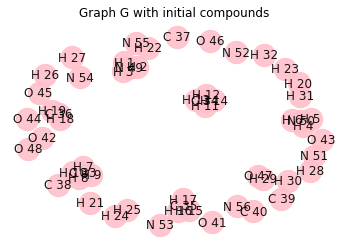

In [8]:
# Adding all the nodes

G.add_edges_from([(H_list[0], N_list[0]), (N_list[0], H_list[1]), (N_list[0], H_list[2])])
G.add_edges_from([(H_list[3], N_list[1]), (N_list[1], H_list[4]), (N_list[1], H_list[5])])

G.add_edges_from([(H_list[6], C_list[0]), (H_list[7], C_list[0]), (H_list[8], C_list[0]), (H_list[9], C_list[0])])
G.add_edges_from([(H_list[10], C_list[1]), (H_list[11], C_list[1]), (H_list[12], C_list[1]), (H_list[13], C_list[1])])

#Added CH3, CH2 and OH to test bond formations. Can be erased later.
G.add_edges_from([(H_list[14], C_list[2]), (H_list[15], C_list[2]), (H_list[16], C_list[2])])
G.add_edges_from([(H_list[17], C_list[3]), (H_list[18], C_list[3])])
G.add_edge(O_list[6], H_list[28])

fix_valencies(G)
plot_fig(G, "Graph G with initial compounds")

In [9]:
nx.nodes(G)

NodeView((H 1, H 2, H 3, H 4, H 5, H 6, H 7, H 8, H 9, H 10, H 11, H 12, H 13, H 14, H 15, H 16, H 17, H 18, H 19, H 20, H 21, H 22, H 23, H 24, H 25, H 26, H 27, H 28, H 29, H 30, H 31, H 32, C 33, C 34, C 35, C 36, C 37, C 38, C 39, C 40, O 41, O 42, O 43, O 44, O 45, O 46, O 47, O 48, N 49, N 50, N 51, N 52, N 53, N 54, N 55, N 56))

In [10]:
# Function to calculate H

def calculate_H(data, T):
    [a_2, a_1, a0, a1, a2, a3, a4, a5, _] = data

    H = sc.R*T*(-a_2*T**-2 + a_1*T**-1*np.log(T) + a0 + 0.5*a1*T + (a2*T**2)/3 + 0.25*a3*T**3 + 0.2*a4*T**4 +a5*T**-1)
    return H

# Function to calculate S

def calculate_S(data, T):
    [a_2, a_1, a0, a1, a2, a3, a4, _, a6] = data

    S = sc.R*(-0.5*a_2*T**-2 - a_1*T**-1 + a0*np.log(T) + a1*T + 0.5*a2*T**2 + (a3*T**3/3) + 0.25*a4*T**4 + a6)

    return S

# Function to calculate G

def calculate_G(H, S, T):
    G = H - T*S
    return G

In [11]:
# Get the list of all components and atoms

atoms = []
compounds = []
all_compounds = nx.connected_components(G)
list_compounds = list(all_compounds)

for i in range(len(list_compounds)):
    if len(list(list_compounds[i])) == 1:
        atoms.append(list(list_compounds[i])[0])
    else:
        compounds.append(list(list_compounds[i]))

In [12]:
free_electrons = []
for i in complete_list:
    val = 0
    compound_contrib = {}
    if np.size(i) > 1:
        for j in i:
            compound_contrib[j] = j.get_total_valency(G)
            val += j.get_total_valency(G)
    else:
        compound_contrib[i] = i.get_total_valency(G)
        val += i.get_total_valency(G)
    free_electrons.append((val, compound_contrib))

In [13]:
maximum_edges = 0; # 52
for lst in [H_list, C_list, O_list, N_list]:
    for atom in lst:
        maximum_edges += atom.get_max_valency()
        
maximum_edges = maximum_edges//2;
print("The maximum number of edges in G graph:", maximum_edges)

The maximum number of edges in G graph: 52


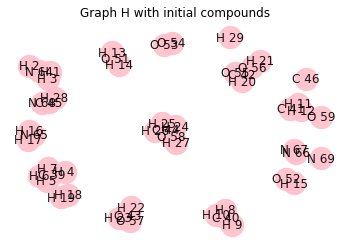

0


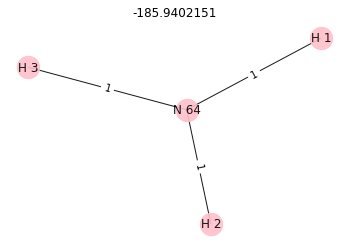

1


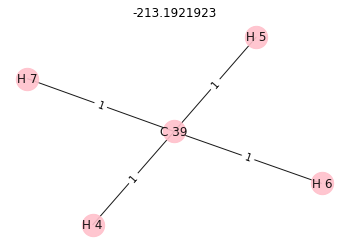

2


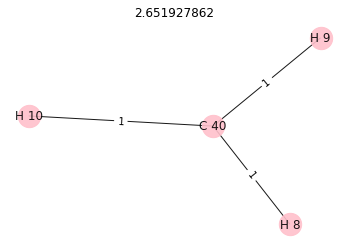

3


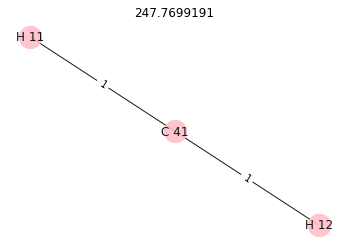

4


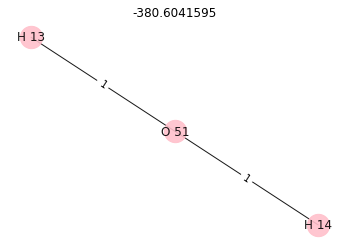

5


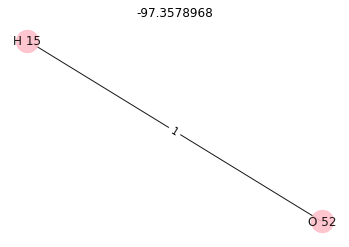

6


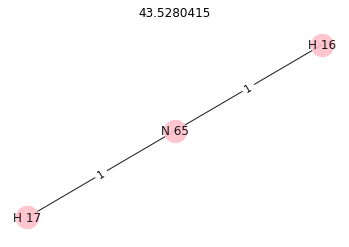

7


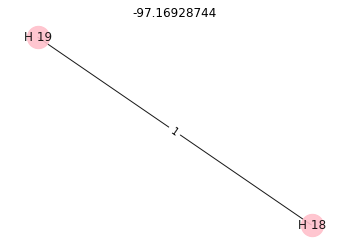

8


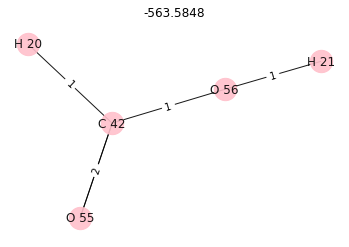

9


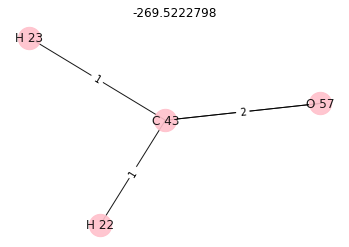

10


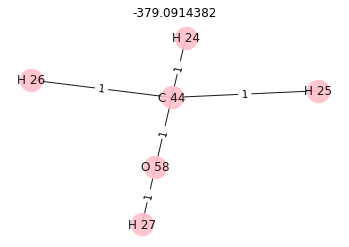

11


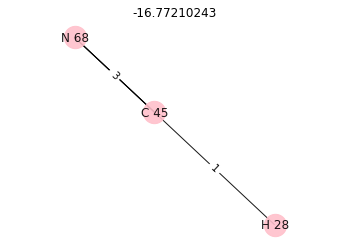

12


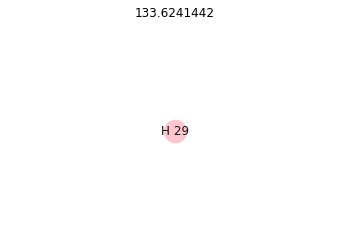

13


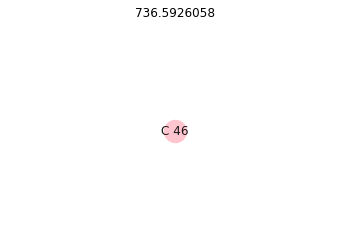

14


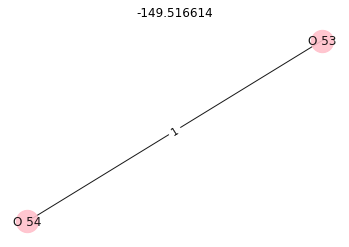

15


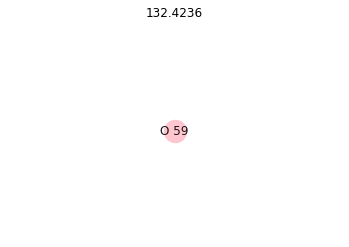

16


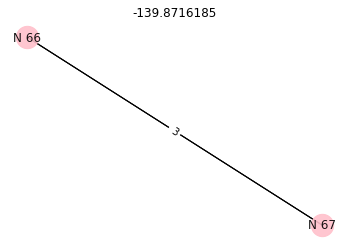

17


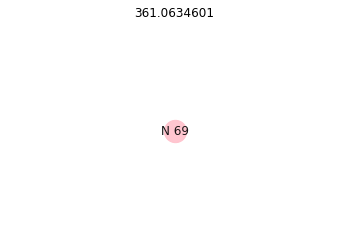

{<networkx.classes.multigraph.MultiGraph object at 0x7fece3471640>: -185.9402151, <networkx.classes.multigraph.MultiGraph object at 0x7fece33c76d0>: -213.1921923, <networkx.classes.multigraph.MultiGraph object at 0x7fece33b04c0>: 2.651927862, <networkx.classes.multigraph.MultiGraph object at 0x7fece3433e20>: 247.7699191, <networkx.classes.multigraph.MultiGraph object at 0x7fece34fad30>: -380.6041595, <networkx.classes.multigraph.MultiGraph object at 0x7fece358e130>: -97.3578968, <networkx.classes.multigraph.MultiGraph object at 0x7fece345a910>: 43.5280415, <networkx.classes.multigraph.MultiGraph object at 0x7fece339f910>: -97.16928744, <networkx.classes.multigraph.MultiGraph object at 0x7fece365beb0>: -563.5848, <networkx.classes.multigraph.MultiGraph object at 0x7fece33ce5e0>: -269.5222798, <networkx.classes.multigraph.MultiGraph object at 0x7fece36091c0>: -379.0914382, <networkx.classes.multigraph.MultiGraph object at 0x7fece348fdc0>: -16.77210243, <networkx.classes.multigraph.MultiG

In [14]:
H = nx.MultiGraph()

H_lists = [Atom("H",i) for i in range(1,30)]
C_lists = [Atom("C",i) for i in range(39, 47)]
O_lists = [Atom("O",i) for i in range(51, 60)]
N_lists = [Atom("N",i) for i in range(64, 70)]
for i,lst in enumerate([H_lists, C_lists, O_lists, N_lists]):
    for comp in lst:
        H.add_node(comp, data=comp)

# nx.draw(H,with_labels=True)
H.add_edges_from([(H_lists[0], N_lists[0]), (N_lists[0], H_lists[1]), (N_lists[0], H_lists[2])])
H.add_edges_from([(H_lists[3], C_lists[0]), (H_lists[4], C_lists[0]), (H_lists[5], C_lists[0]), (H_lists[6], C_lists[0])])
H.add_edges_from([(H_lists[7], C_lists[1]), (H_lists[8], C_lists[1]), (H_lists[9], C_lists[1])])
H.add_edges_from([(H_lists[10], C_lists[2]), (H_lists[11], C_lists[2])])
H.add_edges_from([(H_lists[12], O_lists[0]), (H_lists[13], O_lists[0])])
H.add_edges_from([(H_lists[14], O_lists[1])])
H.add_edges_from([(H_lists[15], N_lists[1]), (N_lists[1], H_lists[16])])
H.add_edges_from([(H_lists[17], H_lists[18])])
H.add_edges_from([(O_lists[2], O_lists[3])])
H.add_edges_from([(N_lists[2], N_lists[3]), (N_lists[2], N_lists[3]), (N_lists[2], N_lists[3])])
H.add_edges_from([(H_lists[19], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[5], C_lists[3]),(H_lists[20], O_lists[5])])
H.add_edges_from([(H_lists[21], C_lists[4]),(O_lists[6], C_lists[4]),(O_lists[6], C_lists[4]),(H_lists[22], C_lists[4])])
H.add_edges_from([(H_lists[23], C_lists[5]), (H_lists[24], C_lists[5]), (H_lists[25], C_lists[5]),(O_lists[7], C_lists[5]),(O_lists[7], H_lists[26])])
H.add_edges_from([(H_lists[27], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6])])
# H.add_edges_from([(H_lists[28], N_lists[5]), (N_lists[5], H_lists[29]), (N_lists[5], C_lists[7]), (H_lists[30], C_lists[7]), (C_lists[7], H_lists[31]), (C_lists[7], C_lists[8]), (O_lists[8], C_lists[8]),(O_lists[8], C_lists[8]),(O_lists[9], C_lists[8]),(H_lists[32], O_lists[9])])
# H.add_edges_from([(H_lists[33], N_lists[6]), (N_lists[6], H_lists[34]), (N_lists[6], C_lists[9]), (H_lists[35], C_lists[9]), (C_lists[9], H_lists[36]), (C_lists[9], C_lists[10]), (O_lists[10], C_lists[10]),(O_lists[10], C_lists[10]),(O_lists[11], C_lists[10])])

plot_fig(H, "Graph H with initial compounds")

data_G = {}
G_value = [-185.9402151,-213.1921923,2.651927862,247.7699191,-380.6041595,-97.3578968,43.5280415,-97.16928744,-563.5848,-269.5222798,-379.0914382,-16.77210243,133.6241442,736.5926058,-149.516614,132.4236,-139.8716185,361.0634601]

entities = nx.connected_components(H)
entities = list(entities)
for i in range(len(entities)):
    print(i)
    sub = H.subgraph(list(entities[i]))
    data_G[sub] = G_value[i]
    plot_fig(sub, G_value[i])
fix_valencies(H)    
print(data_G)

In [15]:
for i in G.nodes:
    i.current_valency(G)

In [16]:
# Finding G of all components given a network
def input_G(G):
    
    cc = list(nx.connected_components(G))
    G_energy = 0
    
    for i in range(len(cc)):
        found = 0
        
        # print("Connected Component G:", cc[i])
        sub_G = G.subgraph(list(cc[i]))
        same = False
        
        for j in data_G:
            # print(j.nodes)
            GH = iso.GraphMatcher(sub_G,j)
            
            # print("Isomorphic:", GH.is_isomorphic())
            if GH.is_isomorphic() == True:
                same = True
            else:
                same = False
            
            if same == True:
                if len(GH.mapping) != 2:
                    for k in GH.mapping: # check mapping of each nodes
                        # print(str(k)[0])
                        # print(str(GH.mapping[k])[0])
                        if str(k)[0] == str(GH.mapping[k])[0]: # Each node's label (without index) should coincide
                            same = True
                        else:
                            same = False
                            break
                else:
                    keys = []
                    values = []
                    for i in GH.mapping.keys():
                        keys.append(str(i).split()[0])
                    for i in GH.mapping.keys():
                        values.append(str(i).split()[0])
                    keys = keys.sort()
                    values = values.sort()
                    if keys == values:
                        same = True
                    else: 
                        same = False
                        
                # print(same)
                
            if same == True: # If compound is found, add G
                found = 1
                break

        if same == True:
            G_energy += data_G[j]
            
        elif same == False: # If compound not found,
            randomp = G.subgraph(list(cc[i]))
            plot_fig(randomp)
            
            val = float(input('Enter G value of %s: '%list(cc[i])))
            data_G[sub_G] = val # Add the new compound's data to our dictionary
            G_energy += val
            # print(G_energy)
    return G_energy

In [17]:
def get_number_bonds(s, max_bonds):
    # Function imitates a Michaelis-Menten curve
    # for the number of bonds allowable at a 
    # given cycle and ceils the value returned.
    bond = math.ceil((max_bonds*s)/(0.5 + s))
    
    return bond

In [18]:
def get_neutral_compound(G):
    G_new = G.copy()
    connected_components = list(nx.connected_components(G_new))
    fix_valencies(G_new)
    single_nodes = [list(i) for i in connected_components if len(i) == 1]
    
    for cc in connected_components:
        if len(cc) > 1:
            M = G_new.subgraph(list(cc))
            plot_fig(M, "Selected Subgraph")
            nodes = list(nx.nodes(M))
            for node in nodes:
                neigh_sum = 0
                if node._valency != 0:
                    neigh_valencies = [(i._valency, i) for i in nx.neighbors(G_new,node)]
                    for i in neigh_valencies: 
                        neigh_sum += i[0]
                        
                    if len(neigh_valencies)>0:
                        possible_neigh = [(i,x[0],x[1]) for i,x in enumerate(neigh_valencies) if x[0]>0]
                        if len(possible_neigh) > 1:
                            pos = random.randint(0, len(possible_neigh)-1)
                            for i in range(min(node._valency, possible_neigh[pos][1])):
                                G_new.add_edge(node, possible_neigh[pos][2])
                            fix_valencies(G_new)
                        elif len(possible_neigh)==1:
                            pos = 0
                            for i in range(min(node._valency, possible_neigh[pos][1])):
                                G_new.add_edge(node, possible_neigh[pos][2])
                            fix_valencies(G_new)
                            
                    if node._valency != 0:
                        noof_H = 0
                        H_nodes = []
                        for i in single_nodes:
                            if i[0]._element == "H":
                                H_nodes.append(i[0])
                                noof_H += 1
                        if node._valency <= noof_H:
                            for i in range(node._valency):
                                G_new.add_edge(node, H_nodes[i])
                        else:
                            N = len(nx.nodes(G_new))+1
                            for i in range(node._valency):
                                new_node = Atom("H", i+N)
                                G_new.add_node(new_node)
                                G_new.add_edge(node, new_node)
                    
                    single_nodes = [list(i) for i in nx.connected_components(G_new) if len(i)==1]
            
                fix_valencies(G_new)
            plot_fig(G_new.subgraph(nx.node_connected_component(G_new,list(cc)[0])),"Neutral subgraph")
    return G_new

In [19]:
def generate_random_graphs(G, max_bonds, probab, max_size):
    G_new = G.copy()
    nodes = []
    for i in nx.connected_components(G_new):
        if len(i) < max_size:
            nodes.extend(list(i))
    
    valency_incomplete_nodes = [i for i in nx.nodes(G_new) if i._valency!=0]
    connected_components = nx.connected_components(G_new)
    num_executed = 0
    
    bonds = get_number_bonds(probab, max_bonds)
    if bonds > max_bonds:
        bonds = 0

    while (nx.number_of_edges(G_new) < bonds) and (len(nodes)>1) and (len(valency_incomplete_nodes) > 1):
        print("Nodes:", nodes)
        num_executed += 1
        flag = 0
        initial_net = G_new
        row = random.randint(0,len(nodes)-1)
        cur_val1 = (nodes[row])._valency
        
        while not(cur_val1 >= 1):
            flag = 1
            row = random.randint(0,len(nodes)-1)
            cur_val1 = nodes[row]._valency
        else:
            print("Row:", row)
            print("Node1:", nodes[row]._name)
            print("Curr val1:", cur_val1)
            col = random.randint(0, len(nodes)-1)
            cur_val2 = nodes[col]._valency
            while (cur_val2 < 1) or (row==col):
                flag = 2
                col = random.randint(0, len(nodes)-1)
                cur_val2 = nodes[col]._valency
                print("Random node choosen:", nodes[col]._name, "; Valency:", nodes[col]._valency)
                if cur_val2 > 0 and (row!=col):
                    max_num_edges = random.randint(1, min(nodes[row]._valency, nodes[col]._valency))
                    print("Col:", col)
                    print("Node2:", nodes[col]._name)
                    print("Curr val2:", cur_val2)
                    print(nodes[row]._valency, nodes[col]._valency)
                    print("max_num_edges:", max_num_edges)
                            
                    for times in range(max_num_edges):
                        G_new.add_edge(nodes[row], nodes[col])
            
            # Pruning any self edges
            for i in range(len(nodes)):
                neigh = G_new[nodes[i]]
                while nodes[i] in neigh:
                    G_new.remove_edge(nodes[i], nodes[i])
                
            # print("flag_end:", flag)
            if flag == 0 and (row!= col):
                if min(nodes[row]._valency, nodes[col]._valency) > 1:
                    max_num_edges = random.randint(1, min(nodes[row]._valency, nodes[col]._valency))
                else: max_num_edges = 1
                for times in range(max_num_edges):
                    G_new.add_edge(nodes[row], nodes[col])
        
        plot_fig(G_new)
        for i in list(nx.nodes(G_new)):
            try:
                # print(i._name, i._valency)
                i.current_valency(G_new)
                # print(i._name, i._valency)
            except ValueError:
                print("ValueException occured !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
                ipdb.set_trace()
                for cc in nx.connected_components(G_new):
                    if nodes[row] in cc:
                        plot_fig(G_new.subgraph(list(cc)))
                
        nodes = []
        for i in nx.connected_components(G_new):
            if len(i) < max_size:
                nodes.extend(list(i))
        
    print("Executed:", num_executed)
    plot_fig(G_new)
    G_fixed = get_neutral_compound(G_new)
    plot_fig(G_fixed)
    
    return G_fixed

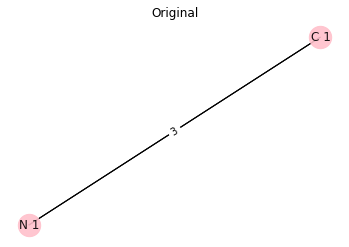

Executed: 0


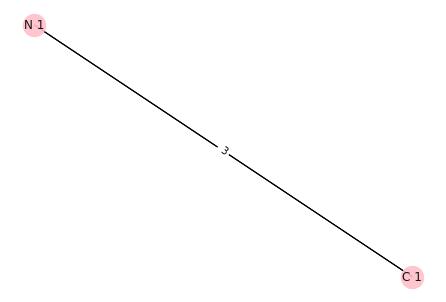

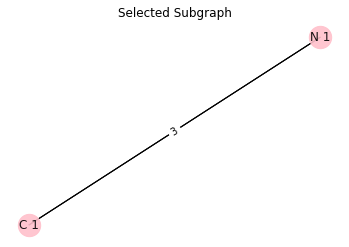

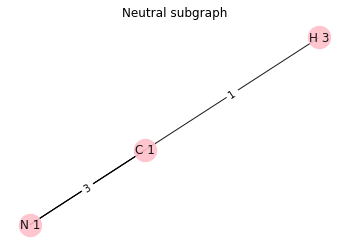

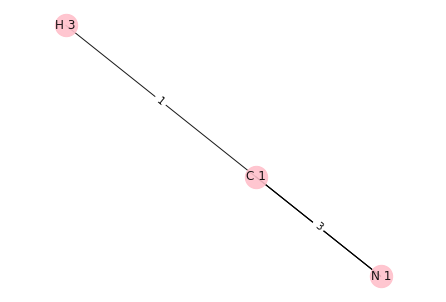

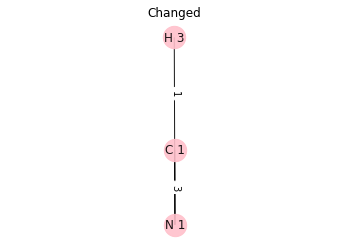

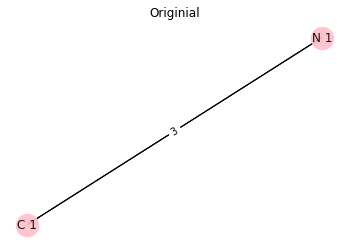

In [20]:
c1 = Atom("C", 1)
n1 = Atom("N", 1)

test = nx.MultiGraph()
test.add_node(c1)
test.add_node(n1)

test.add_edges_from([(c1,n1), (c1,n1), (c1,n1)])
fix_valencies(test)
plot_fig(test, "Original")
test_new = generate_random_graphs(test, 4, 5, 7)
plot_fig(test_new, "Changed")
plot_fig(test, "Originial")

H 1 1
H 2 1
H 3 1
H 4 1
H 5 1
C 1 4
C 2 4
C 3 4
C 4 4
C 5 4
O 1 2
O 2 2
O 3 2
O 4 2
O 5 2
N 1 3
N 2 3
N 3 3
N 4 3
N 5 3
Nodes: [H 1, H 2, H 3, H 4, H 5, C 1, C 2, C 3, C 4, C 5, O 1, O 2, O 3, O 4, O 5, N 1, N 2, N 3, N 4, N 5]
Row: 3
Node1: H 4
Curr val1: 1
Random node choosen: O 2 ; Valency: 2
Col: 11
Node2: O 2
Curr val2: 2
1 2
max_num_edges: 1


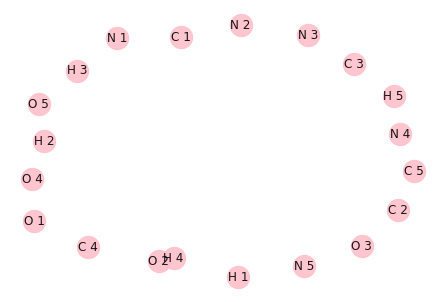

Nodes: [H 1, H 2, H 3, O 2, H 4, H 5, C 1, C 2, C 3, C 4, C 5, O 1, O 3, O 4, O 5, N 1, N 2, N 3, N 4, N 5]
Row: 6
Node1: C 1
Curr val1: 4


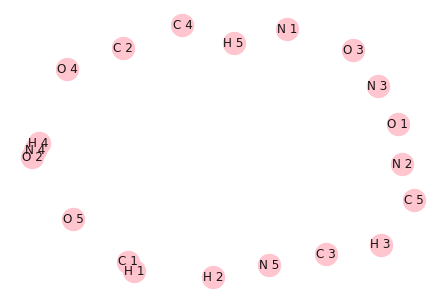

Nodes: [C 1, H 1, H 2, H 3, O 2, H 4, H 5, C 2, C 3, C 4, C 5, O 1, O 3, O 4, O 5, N 1, N 2, N 3, N 4, N 5]
Row: 0
Node1: C 1
Curr val1: 3


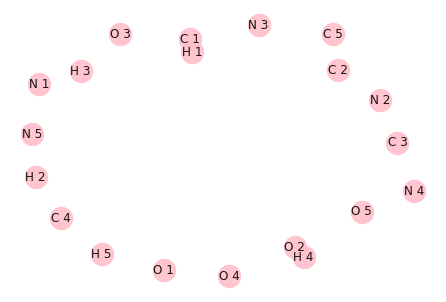

Nodes: [C 1, H 1, H 2, H 3, O 2, H 4, H 5, C 2, C 3, C 4, C 5, O 1, O 3, O 4, O 5, N 1, N 2, N 3, N 4, N 5]
Row: 17
Node1: N 3
Curr val1: 3
Random node choosen: C 1 ; Valency: 3
Col: 0
Node2: C 1
Curr val2: 3
3 3
max_num_edges: 1


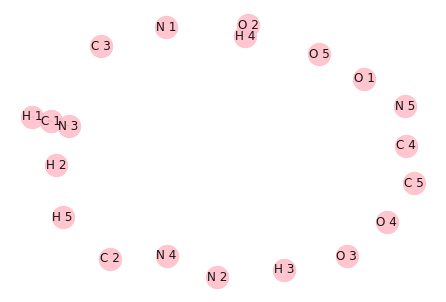

Nodes: [H 2, H 3, O 2, H 4, H 5, C 2, C 3, C 4, C 5, O 1, O 3, O 4, O 5, N 1, N 2, N 4, N 5]
Row: 4
Node1: H 5
Curr val1: 1
Random node choosen: C 3 ; Valency: 4
Col: 6
Node2: C 3
Curr val2: 4
1 4
max_num_edges: 1


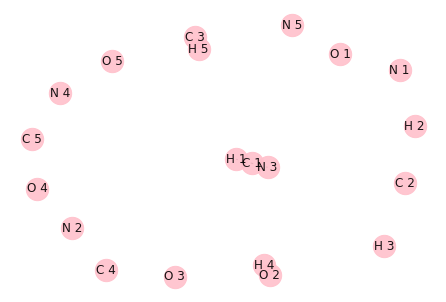

Nodes: [H 2, H 3, O 2, H 4, C 3, H 5, C 2, C 4, C 5, O 1, O 3, O 4, O 5, N 1, N 2, N 4, N 5]
Row: 14
Node1: N 2
Curr val1: 3


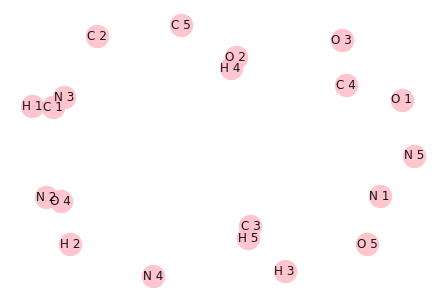

Nodes: [H 2, H 3, O 2, H 4, C 3, H 5, C 2, C 4, C 5, O 1, O 3, N 2, O 4, O 5, N 1, N 4, N 5]
Row: 7
Node1: C 4
Curr val1: 4


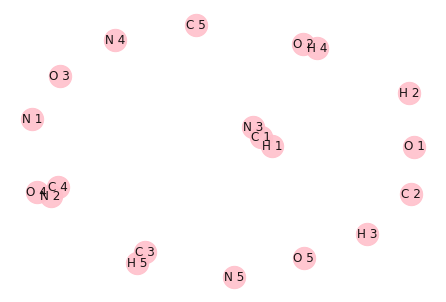

Nodes: [H 2, H 3, O 2, H 4, C 3, H 5, C 2, C 5, O 1, O 3, O 5, N 1, N 4, N 5]
Row: 2
Node1: O 2
Curr val1: 1


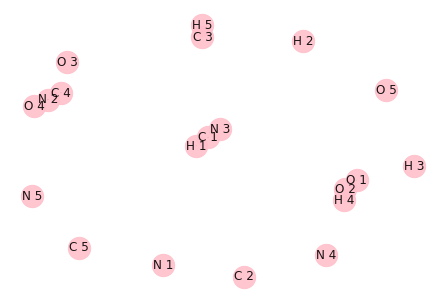

Nodes: [H 2, H 3, C 3, H 5, C 2, C 5, O 3, O 5, N 1, N 4, N 5]
Row: 7
Node1: O 5
Curr val1: 2


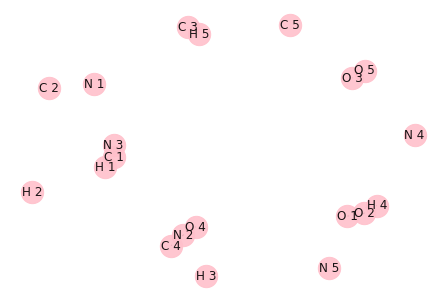

Nodes: [H 2, H 3, C 3, H 5, C 2, C 5, O 5, O 3, N 1, N 4, N 5]
Row: 10
Node1: N 5
Curr val1: 3


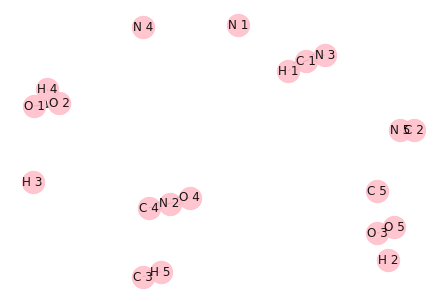

Nodes: [H 2, H 3, C 3, H 5, N 5, C 2, C 5, O 5, O 3, N 1, N 4]
Row: 2
Node1: C 3
Curr val1: 3


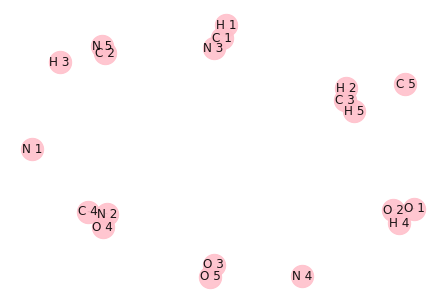

Executed: 11


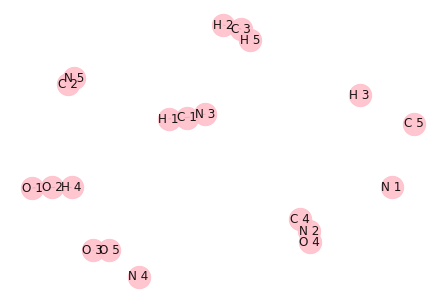

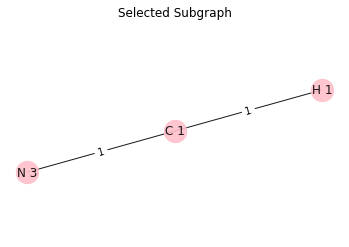

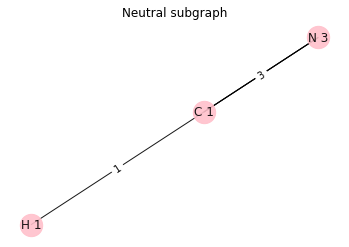

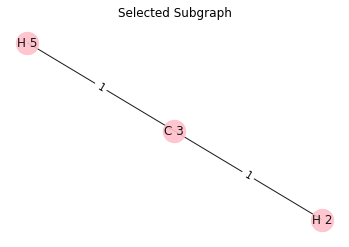

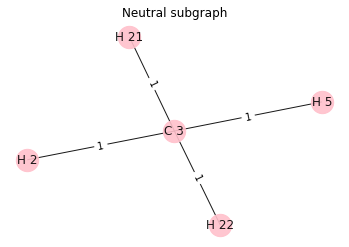

...

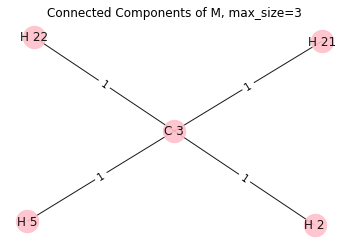

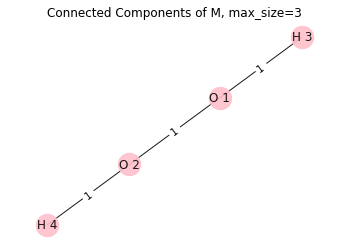

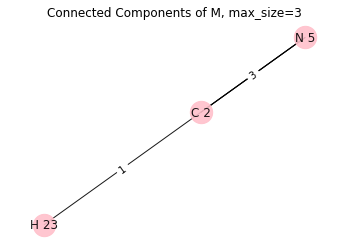

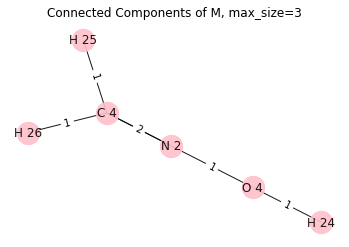

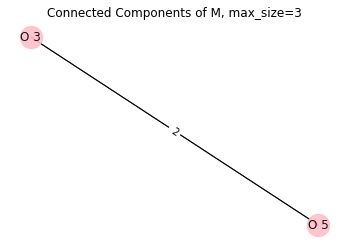

Nodes: [H 1, H 2, H 3, H 4, H 5, C 1, C 2, C 3, C 4, C 5, O 1, O 2, O 3, O 4, O 5, N 1, N 2, N 3, N 4, N 5]
Row: 18
Node1: N 4
Curr val1: 3
Random node choosen: H 1 ; Valency: 0
Random node choosen: O 3 ; Valency: 0
Random node choosen: H 2 ; Valency: 0
Random node choosen: N 1 ; Valency: 3
Col: 15
Node2: N 1
Curr val2: 3
3 3
max_num_edges: 1


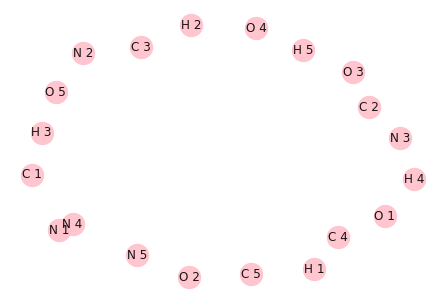

Nodes: [H 1, H 2, H 3, H 4, H 5, C 1, C 2, C 3, C 4, C 5, O 1, O 2, O 3, O 4, O 5, N 2, N 3, N 5]
Row: 10
Node1: O 1
Curr val1: 2


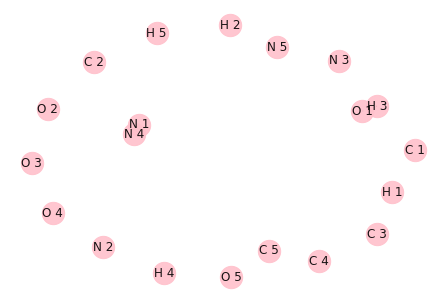

Nodes: [H 1, H 2, H 4, H 5, C 1, C 2, C 3, C 4, C 5, O 2, O 3, O 4, O 5, N 2, N 3, N 5]
Row: 4
Node1: C 1
Curr val1: 4


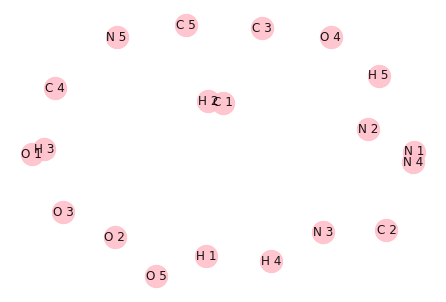

Nodes: [H 1, H 4, H 5, C 2, C 3, C 4, C 5, O 2, O 3, O 4, O 5, N 2, N 3, N 5]
Row: 10
Node1: O 5
Curr val1: 2


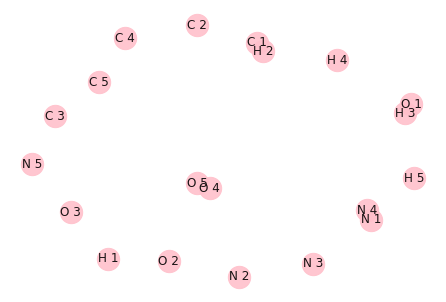

Nodes: [H 1, H 4, H 5, C 2, C 3, C 4, C 5, O 2, O 3, N 2, N 3, N 5]
Row: 8
Node1: O 3
Curr val1: 2


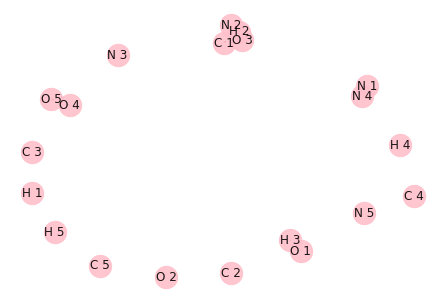

Nodes: [H 1, H 4, H 5, C 2, C 3, C 4, C 5, O 2, N 3, N 5]
Row: 2
Node1: H 5
Curr val1: 1


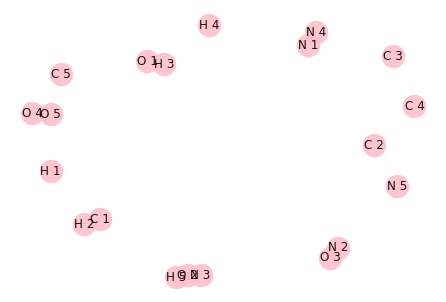

Nodes: [H 1, H 4, C 2, C 3, C 4, C 5, O 2, N 5]
Row: 2
Node1: C 2
Curr val1: 4


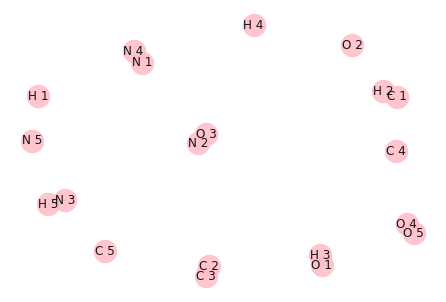

Nodes: [H 1, H 4, C 4, C 5, O 2, N 5]
Row: 2
Node1: C 4
Curr val1: 4


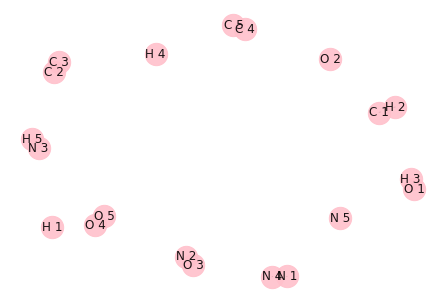

Nodes: [H 1, H 4, O 2, N 5]
Row: 3
Node1: N 5
Curr val1: 3


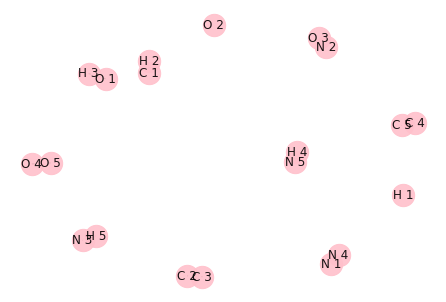

Nodes: [H 1, O 2]
Row: 1
Node1: O 2
Curr val1: 2
Random node choosen: H 1 ; Valency: 1
Col: 0
Node2: H 1
Curr val2: 1
2 1
max_num_edges: 1


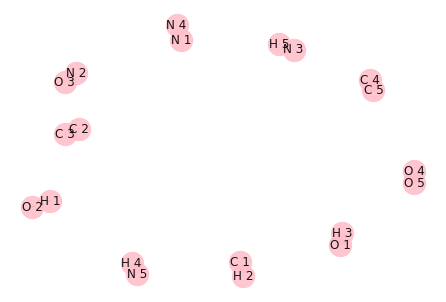

Executed: 10


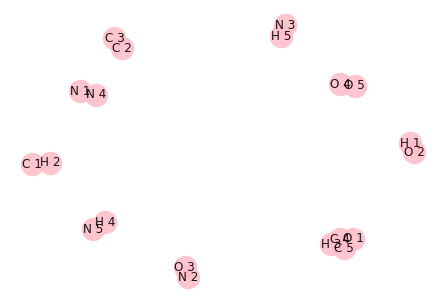

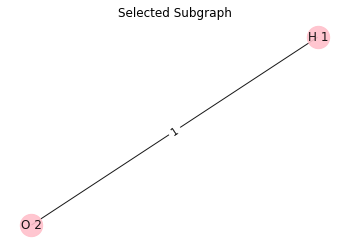

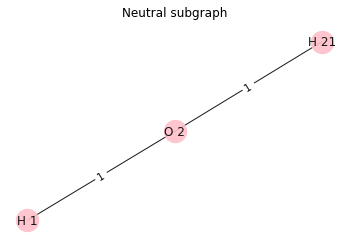

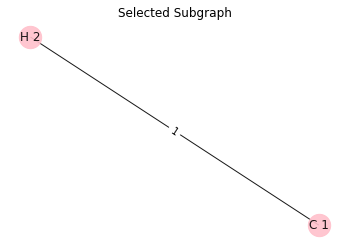

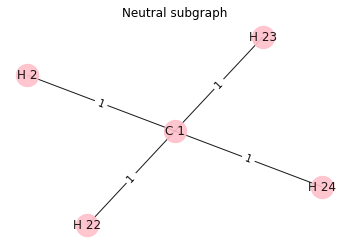

...

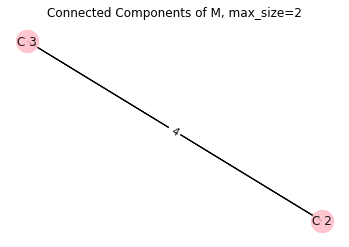

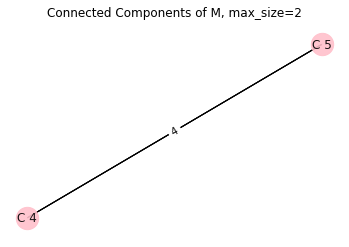

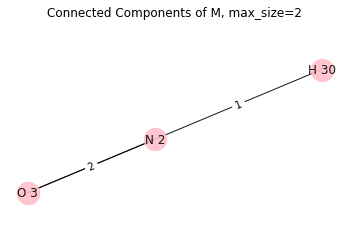

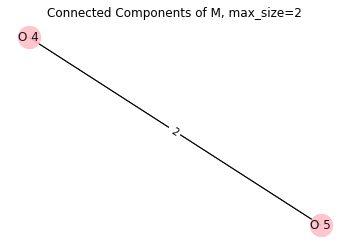

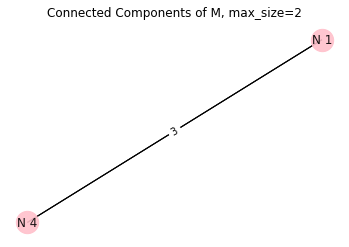

In [21]:
A_list = [Atom("H", i) for i in range(1,6)]
B_list = [Atom("C", i) for i in range(1,6)]
Z_list = [Atom("O", i) for i in range(1,6)]
Y_list = [Atom("N", i) for i in range(1,6)]


M = nx.MultiGraph()
for i,lst in enumerate([A_list, B_list, Z_list, Y_list]):
    for comp in lst:
        M.add_node(comp, data=comp)

fix_valencies(M)
for node in nx.nodes(M):
    print(node._name, node._valency)

new_M2 = generate_random_graphs(M, 15, 2, 3)
for i in nx.connected_components(new_M2):
    if len(i) > 1:
        plot_fig(new_M2.subgraph(list(i)), "Connected Components of M, max_size=3")
        
new_M3 = generate_random_graphs(M, 15, 2, 2)
for i in nx.connected_components(new_M3):
    if len(i) > 1:
        plot_fig(new_M3.subgraph(list(i)), "Connected Components of M, max_size=2")

In [22]:
def rearrange_connected_components(G, cc, n, times):
    for i in range(times):
        comp1_idx = random.randint(0,n-1)
        comp2_idx = random.randint(0,n-1)
        comp1 = G.subgraph(list(cc[comp1_idx]))
        comp2 = G.subgraph(list(cc[comp2_idx]))
        
        attr1 = nx.get_edge_attributes(comp1, 'number')
        attr2 = nx.get_edge_attributes(comp2, 'number')
        num_rewire = 0
        
        if len(attr1) > 0 and len(attr2) > 0:
            rewire_flag = False
            attempt = 0
            # Allowing t approx 3 attempts max, in case it didn't rewire
            while (rewire_flag == False) and (attempt < 3):
                edge1_idx = random.randint(0,len(attr1)-1)
                edge1_valence = list(attr1.values())[edge1_idx]
                edge1_nodes = list(attr1.keys())[edge1_idx]

                possible_edge2_nodes = [i for i in attr2 if attr2[i]==edge1_valence]
                if len(possible_edge2_nodes) >= 1: 
                    r = random.randint(0, len(possible_edge2_nodes)-1)
                    edge2_nodes = possible_edge2_nodes[r]
                    
                    G.remove_edge(edge1_nodes[0], edge1_nodes[1])
                    G.remove_edge(edge2_nodes[0], edge2_nodes[1])
                    num_rewire += 1
                    rewire_flag = True
                    attempt += 1
                    for number in range(edge1_valence):
                        G.add_edge(edge1_nodes[0], edge2_nodes[0])
                        G.add_edge(edge1_nodes[1], edge2_nodes[1])
        
        if len(attr1) > 0 and len(attr2) == 0:
            max_valency = list(cc[comp2_idx])[0]._valency
            possible_edge1_nodes = [i for i in attr1 if attr1[i]<=max_valency]
            if len(possible_edge1_nodes) >= 1:
                r = random.randint(0, len(possible_edge1_nodes)-1)
                edge1_nodes = possible_edge1_nodes[r]
                valency = attr1[edge1_nodes]

                G.remove_edge(edge1_nodes[0], edge1_nodes[1])
                num_rewire += 1
                for number in range(valency):
                    G.add_edge(edge1_nodes[0], list(cc[comp2_idx])[0])

        if len(attr2) > 0 and len(attr1) == 0:
            max_valency = list(cc[comp1_idx])[0]._valency
            possible_edge2_nodes = [i for i in attr2 if attr2[i]<=max_valency]
            if len(possible_edge2_nodes) >= 1: 
                r = random.randint(0, len(possible_edge2_nodes)-1)
                edge2_nodes = possible_edge2_nodes[r]
                valency = attr2[edge2_nodes]

                G.remove_edge(edge2_nodes[0], edge2_nodes[1])
                num_rewire += 1
                for number in range(valency):
                    G.add_edge(edge2_nodes[0], list(cc[comp1_idx])[0])
                    
        for i in nx.nodes(G):
            i.current_valency(G)
        
    return G

In [23]:
# Simulated Annealing

def simulated_annealing(best_G, max_bonds, least_energy, bond_factor, T, max_size):
    p = random.uniform(0.0, 1.0)
    cc = list(nx.connected_components(G))
    n = len(cc)
    
    if p < 0.1:
        times = n//2        
        G_rand = generate_random_graphs(G, max_bonds, bond_factor, max_size)
        G_new = rearrange_connected_components(G_rand, cc, n, times)
        G_new = get_neutral_compound(G_new)
        new_energy = input_G(G_new)
        rand_energy = input_G(G_rand)
    
    elif p < 0.6:
        times = min(n//2, 2)
        G_rand = generate_random_graphs(G, max_bonds, bond_factor, max_size)
        G_new = rearrange_connected_components(G_rand, cc, n, times)
        G_new = get_neutral_compound(G_new)
        new_energy = input_G(G_new)
        rand_energy = input_G(G_rand)
    
    elif p<0.8:
        times = min(n//2, 1)
        G_rand = generate_random_graphs(G, max_bonds, bond_factor, max_size)
        G_new = rearrange_connected_components(G_rand, cc, n, times)
        G_new = get_neutral_compound(G_new)
        new_energy = input_G(G_new)
        rand_energy = input_G(G_rand)
    else:
        times = min(n//2, 1)
        G_rand = generate_random_graphs(G, max_bonds, bond_factor, max_size)
        G_new = rearrange_connected_components(G_rand, cc, n, times)
        G_new = get_neutral_compound(G_new)
        new_energy = input_G(G_new)
        rand_energy = input_G(G_rand)
        
    if new_energy < least_energy and new_energy < rand_energy:
        best_G = G_new
        least_energy = new_energy
    elif rand_energy < new_energy and rand_energy < least_energy:
        best_G = G_rand
        least_energy = rand_energy
    else:
        p_decide = random.uniform(0.0,1.0)
        try:
            accept_new = math.exp(-(new_energy-least_energy)/T)
        except:
            if (new_energy-least_energy) > 0:
                accept_new = 0
            else:
                accept_new = float('inf')
        try:
            accept_rand = math.exp(-(rand_energy-least_energy)/T)
        except:
            if (rand_energy-least_energy) > 0:
                accept_rand = 0
            else:
                accept_rand = float('inf')

        if p_decide < accept_new:
            best_G = G_new
            least_energy = new_energy
        elif p_decide < accept_rand:
            best_G = G_rand
            least_energy = rand_energy
    
    return (best_G, least_energy)   

Executed: 0


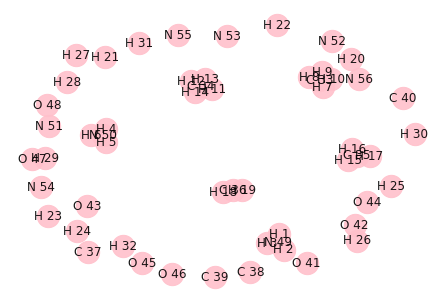

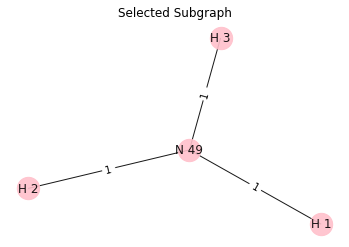

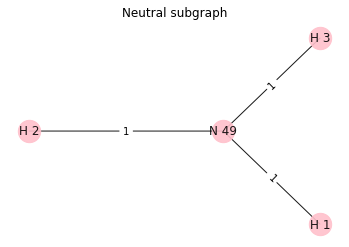

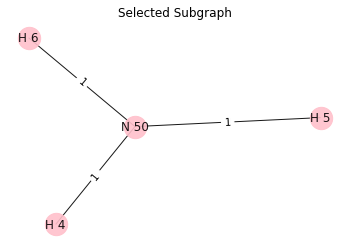

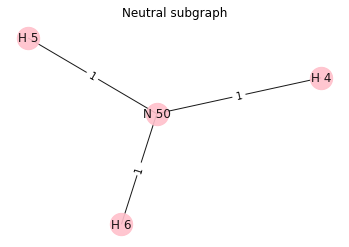

...

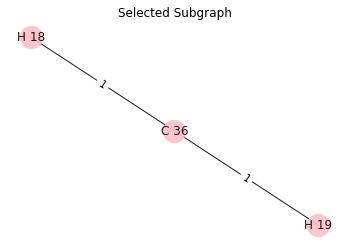

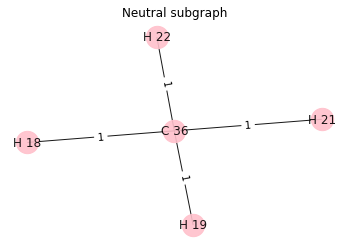

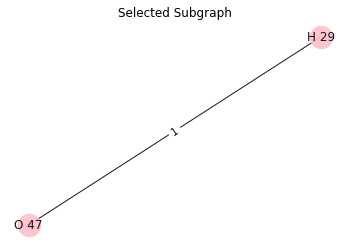

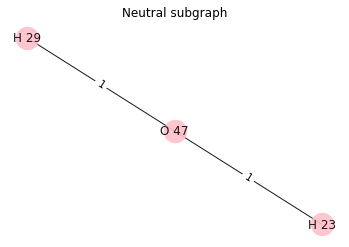

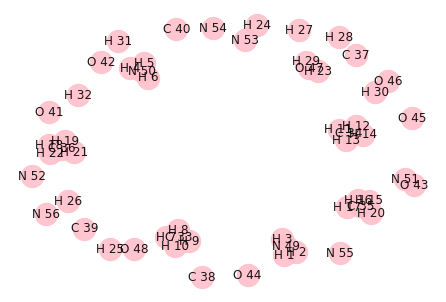

Nodes: [H 24, H 25, H 26, H 27, H 28, H 30, H 31, H 32, C 37, C 38, C 39, C 40, O 41, O 42, O 43, O 44, O 45, O 46, O 48, N 51, N 52, N 53, N 54, N 55, N 56]
Row: 11
Node1: C 40
Curr val1: 4


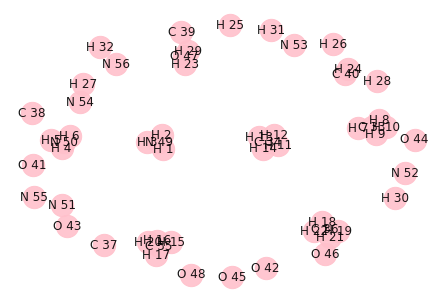

Nodes: [H 24, C 40, H 25, H 26, H 27, H 28, H 30, H 31, H 32, C 37, C 38, C 39, O 41, O 42, O 43, O 44, O 45, O 46, O 48, N 51, N 52, N 53, N 54, N 55, N 56]
Row: 21
Node1: N 53
Curr val1: 3


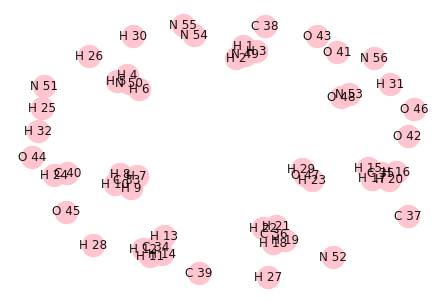

Nodes: [H 24, C 40, H 25, H 26, H 27, H 28, H 30, H 31, H 32, C 37, C 38, C 39, O 41, O 42, O 43, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54, N 55, N 56]
Row: 7
Node1: H 31
Curr val1: 1


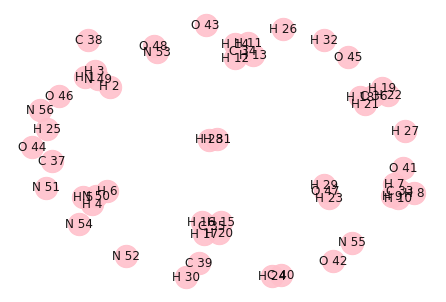

Nodes: [H 24, C 40, H 25, H 26, H 27, H 31, H 28, H 30, H 32, C 37, C 38, C 39, O 41, O 42, O 43, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54, N 55, N 56]
Row: 24
Node1: N 56
Curr val1: 3


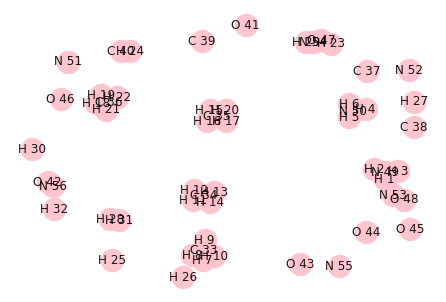

Nodes: [H 24, C 40, H 25, H 26, H 27, H 31, H 28, H 30, H 32, C 37, C 38, C 39, O 41, N 56, O 42, O 43, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54, N 55]
Row: 15
Node1: O 43
Curr val1: 2


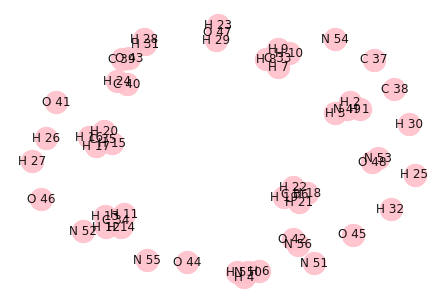

Nodes: [H 24, C 40, H 25, H 26, H 27, H 31, H 28, H 30, H 32, C 37, C 38, C 39, O 43, O 41, N 56, O 42, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54, N 55]
Row: 7
Node1: H 30
Curr val1: 1


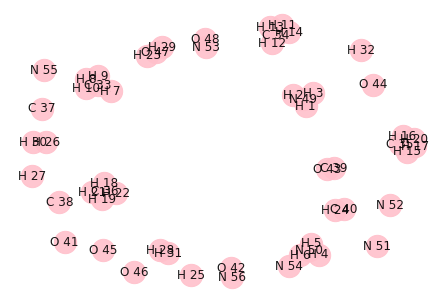

Nodes: [H 24, C 40, H 25, H 26, H 30, H 27, H 31, H 28, H 32, C 37, C 38, C 39, O 43, O 41, N 56, O 42, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54, N 55]
Row: 15
Node1: O 42
Curr val1: 1


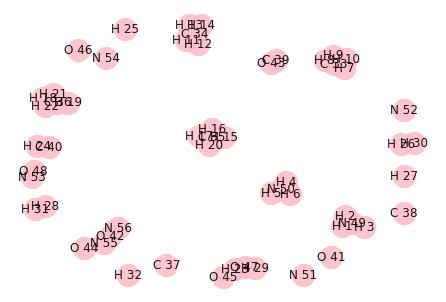

Nodes: [H 24, C 40, H 25, H 26, H 30, H 27, H 31, H 28, H 32, C 37, C 38, C 39, O 43, O 41, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54]
Row: 20
Node1: N 52
Curr val1: 3


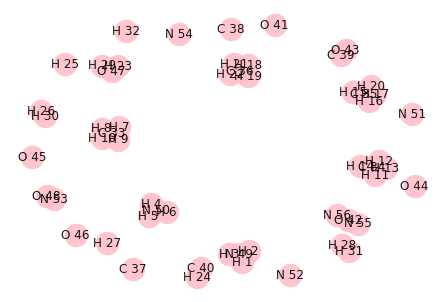

Nodes: [H 24, C 40, H 25, H 26, H 30, H 27, H 31, H 28, H 32, C 37, C 38, C 39, O 43, O 41, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54]
Row: 10
Node1: C 38
Curr val1: 4


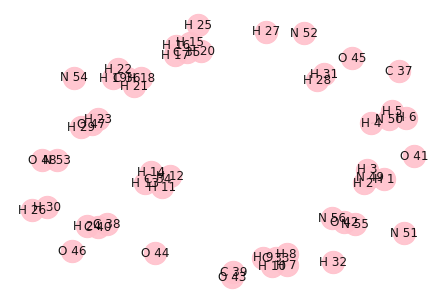

Nodes: [H 25, H 26, H 30, H 27, H 31, H 28, H 32, C 37, C 39, O 43, O 41, O 44, O 45, O 46, N 53, O 48, N 51, N 52, N 54]
Row: 8
Node1: C 39
Curr val1: 2


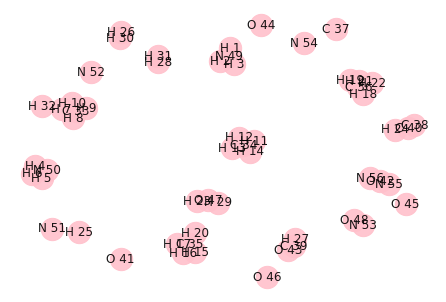

Executed: 10


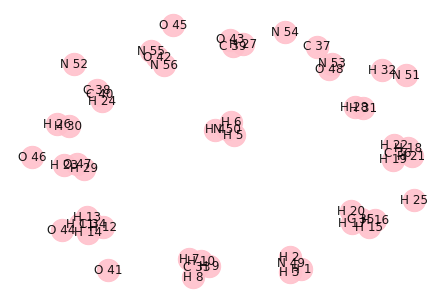

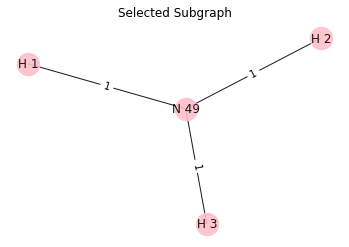

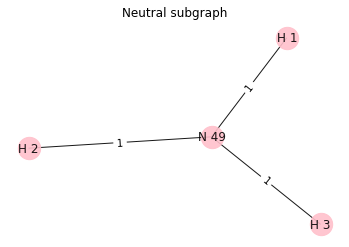

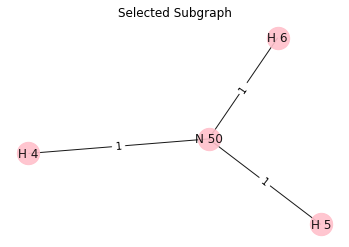

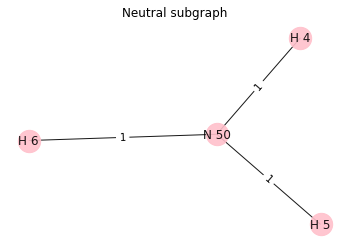

...

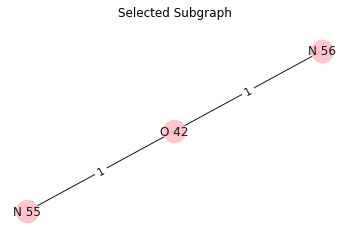

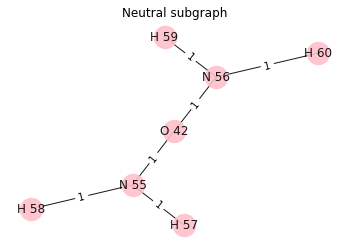

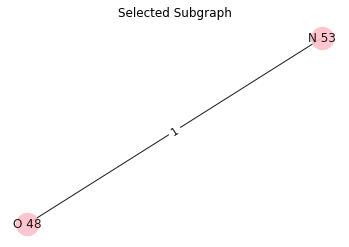

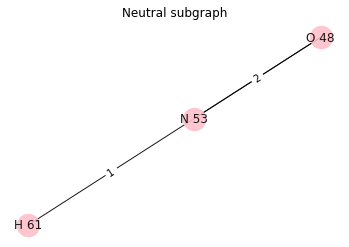

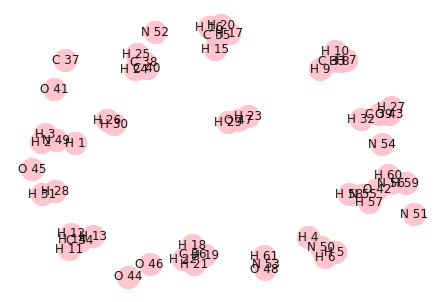

Executed: 0


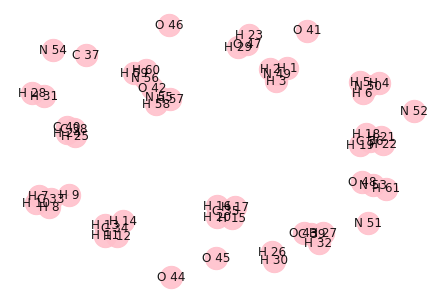

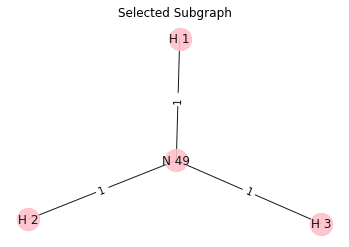

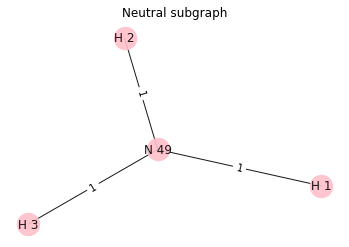

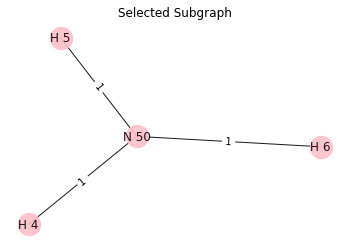

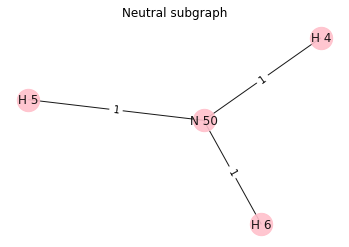

...

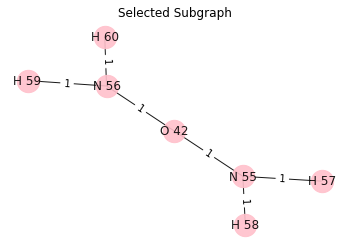

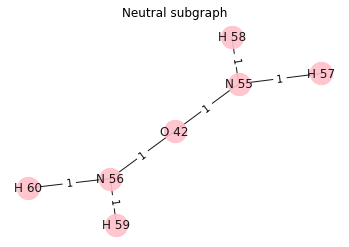

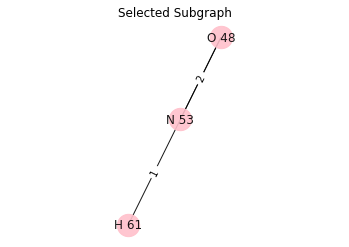

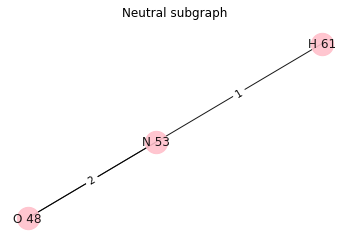

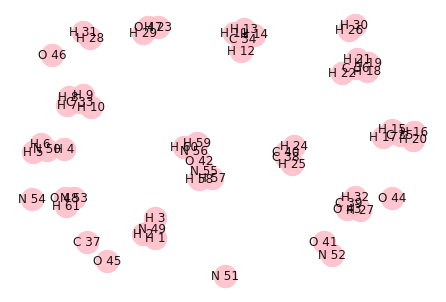

Nodes: [H 26, H 30, H 31, H 28, C 37, O 41, O 44, O 45, O 46, N 51, N 52, N 54]
Row: 11
Node1: N 54
Curr val1: 3
Random node choosen: O 46 ; Valency: 2
Col: 8
Node2: O 46
Curr val2: 2
3 2
max_num_edges: 2


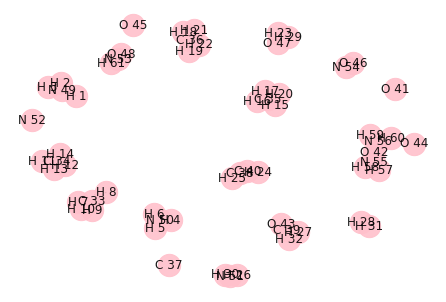

Executed: 1


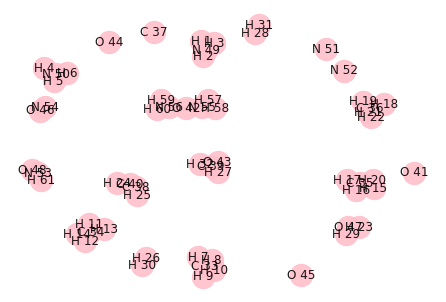

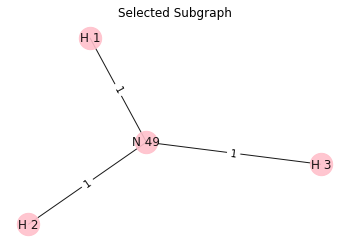

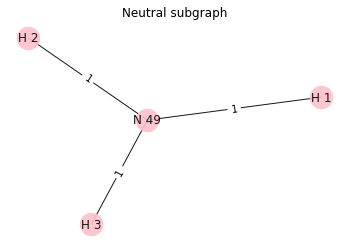

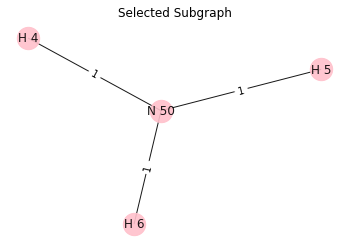

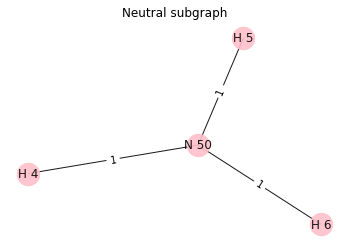

...

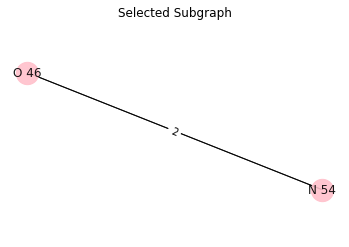

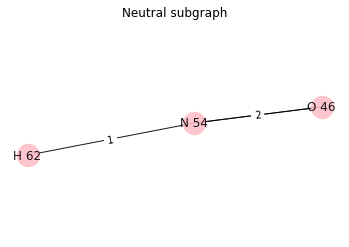

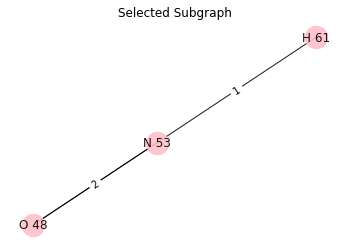

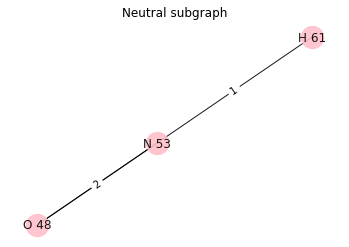

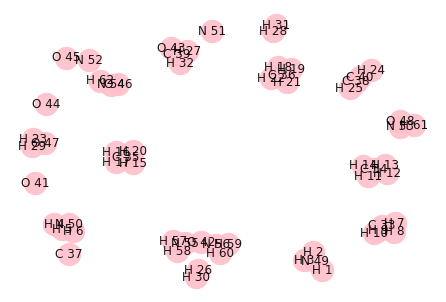

Executed: 0


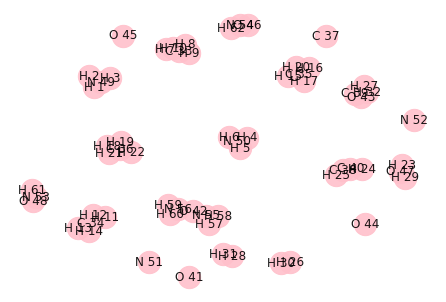

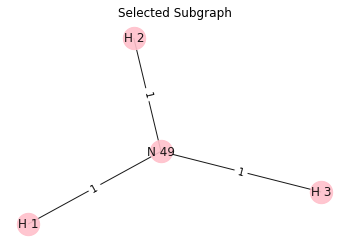

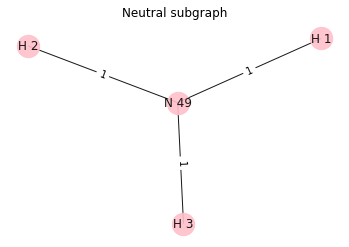

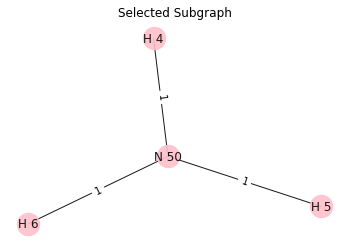

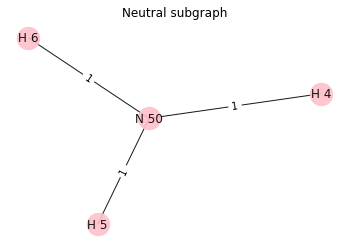

...

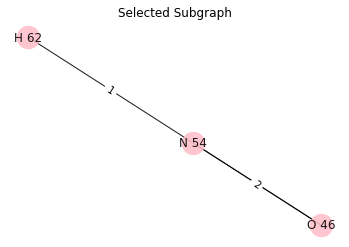

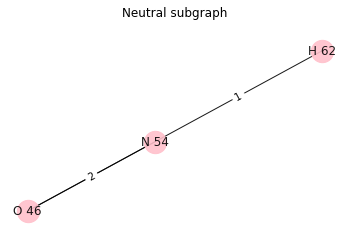

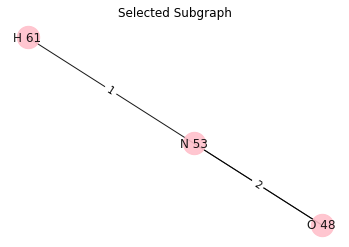

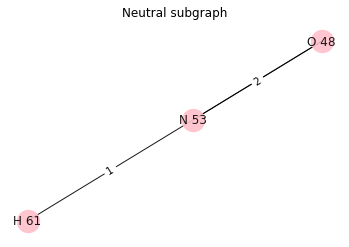

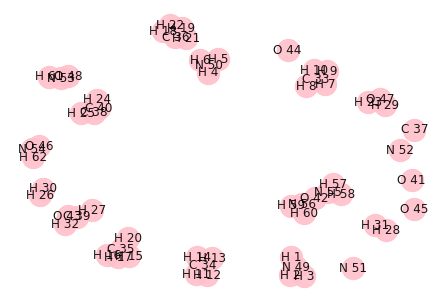

Nodes: [H 26, H 30, H 31, H 28, C 37, O 41, O 44, O 45, N 51, N 52]
Row: 5
Node1: O 41
Curr val1: 2


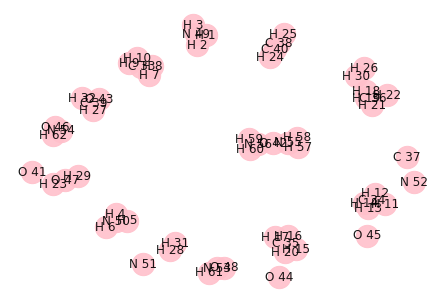

Nodes: [H 26, H 30, H 31, H 28, C 37, O 41, O 44, O 45, N 51, N 52]
Row: 9
Node1: N 52
Curr val1: 3


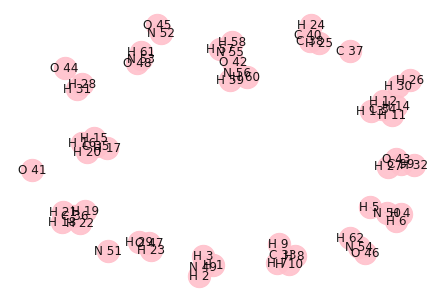

Executed: 2


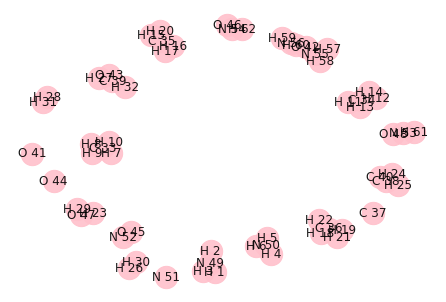

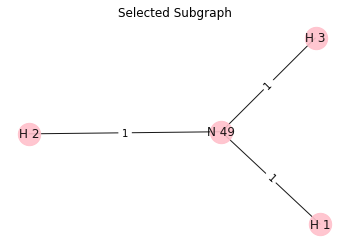

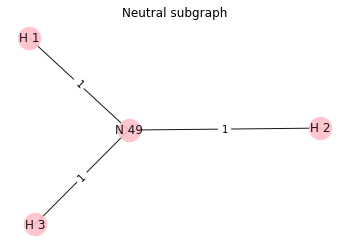

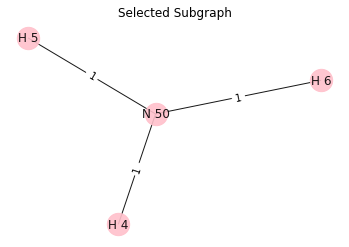

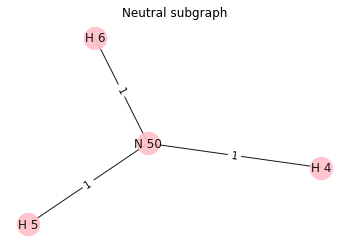

...

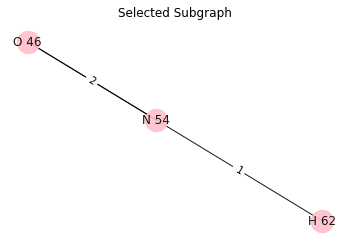

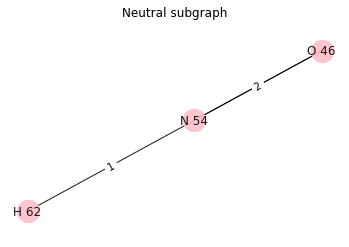

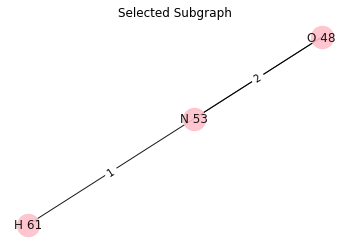

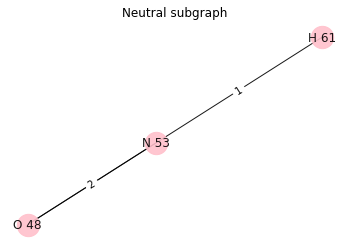

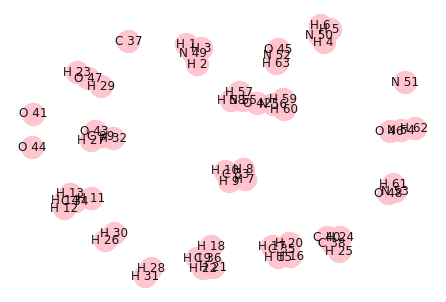

Executed: 0


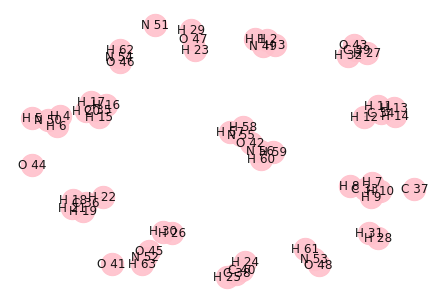

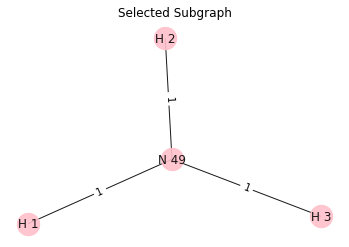

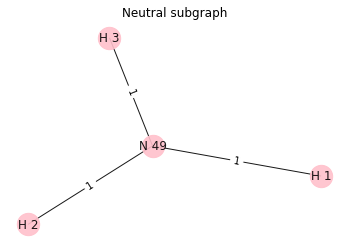

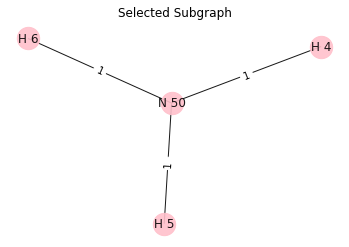

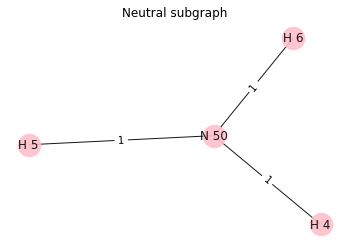

...

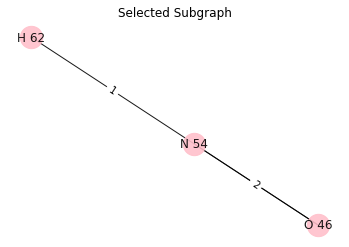

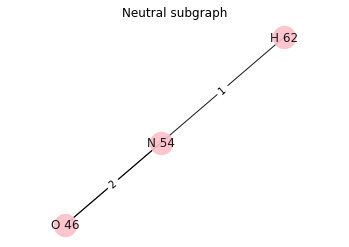

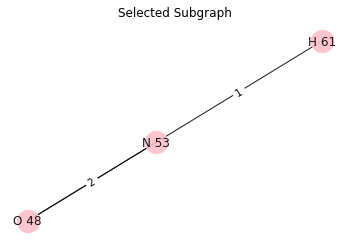

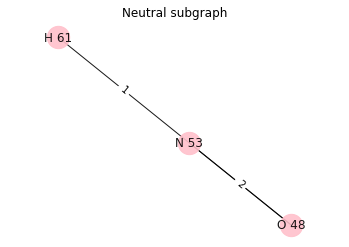

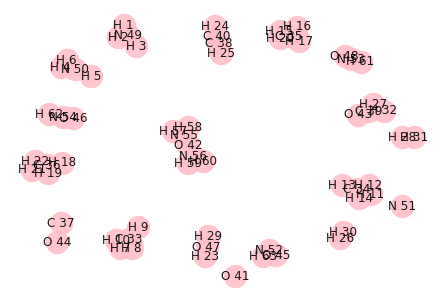

Executed: 0


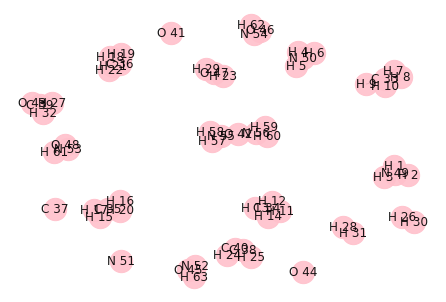

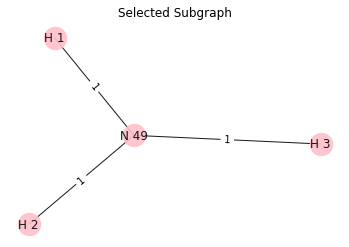

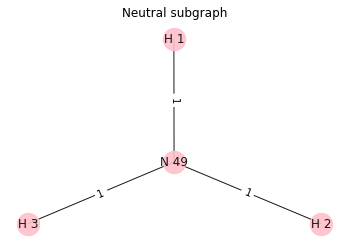

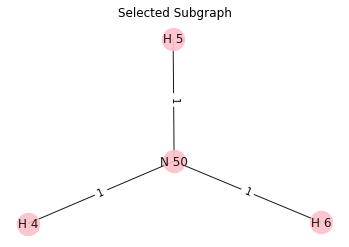

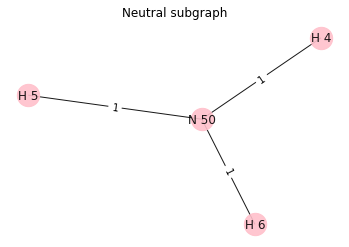

...

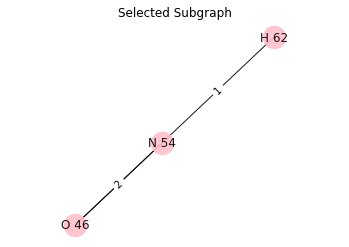

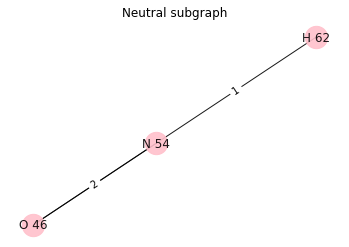

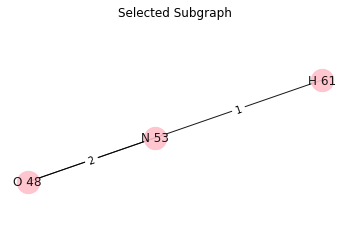

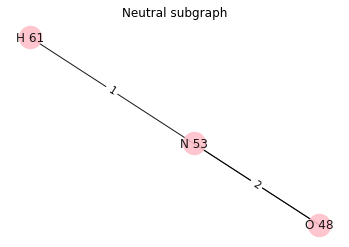

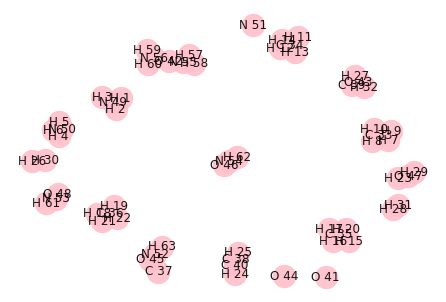

Executed: 0


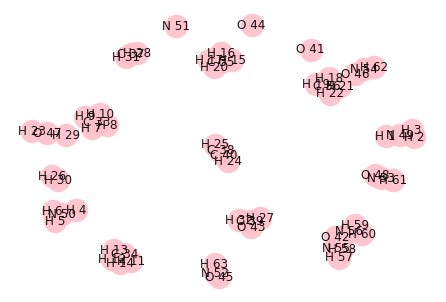

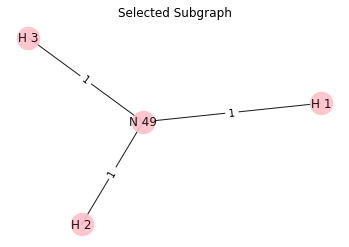

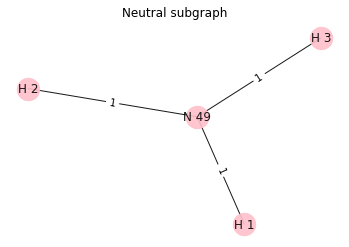

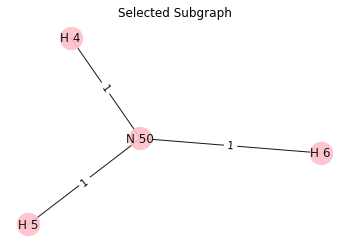

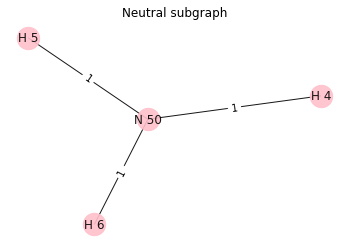

...

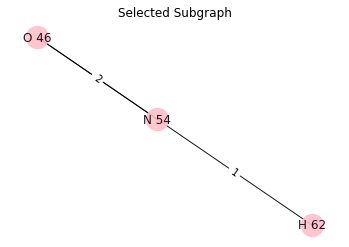

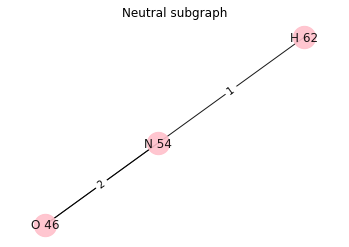

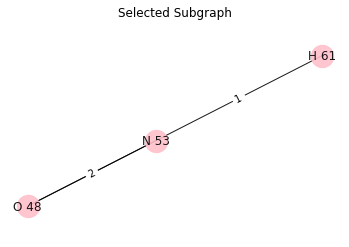

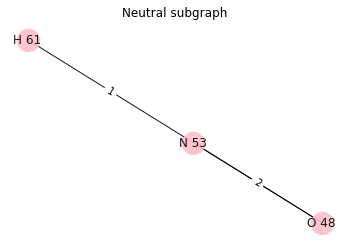

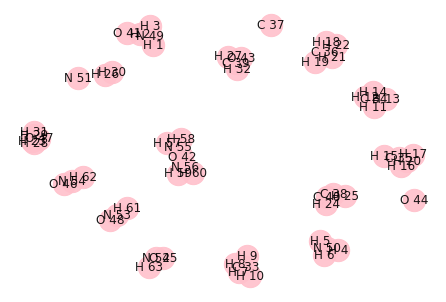

Executed: 0


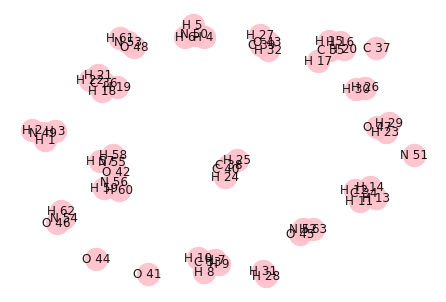

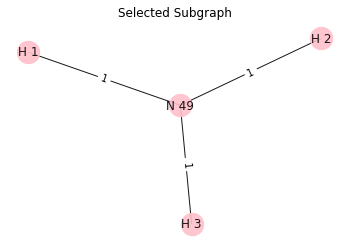

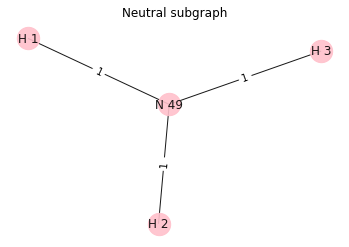

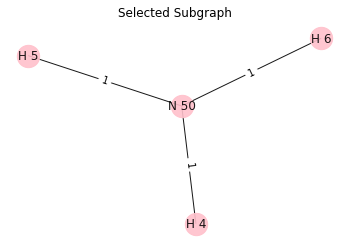

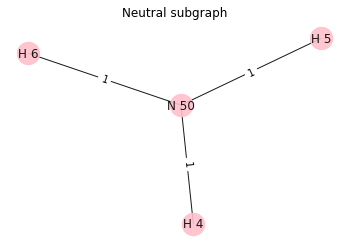

...

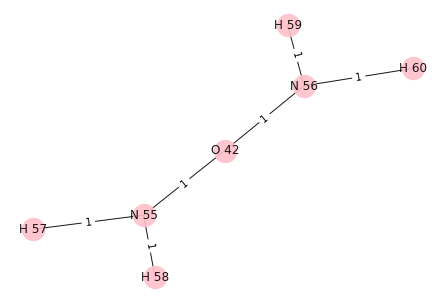

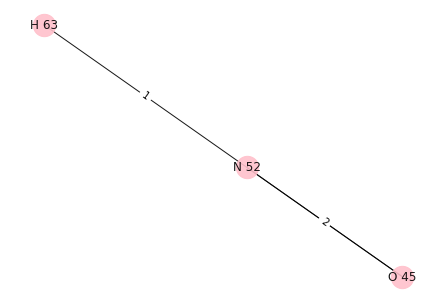

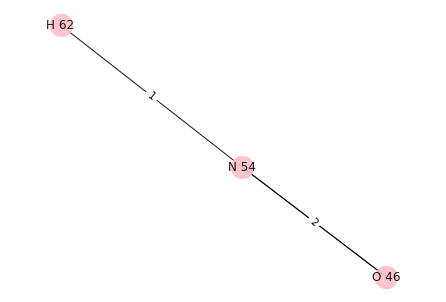

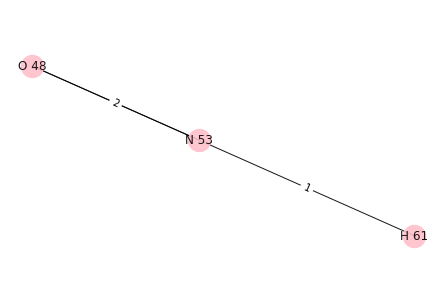

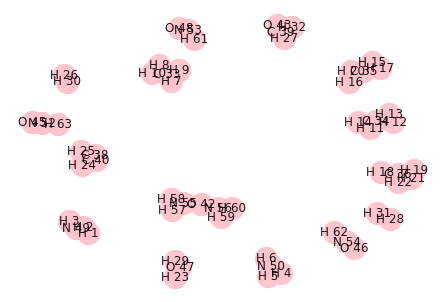

In [24]:
trails = 10
G_list = []
for i in range(trails):
    G = generate_random_graphs(G, maximum_edges, i,3)
#     plot_fig(G_list[-1])

new_G = nx.MultiGraph()

for i in nx.connected_components(G):
    if len(i)>1:
        plot_fig(G.subgraph(list(i)))
        new_G = nx.compose(new_G,G.subgraph(list(i)))
        
plot_fig(new_G)

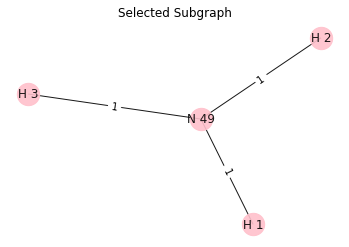

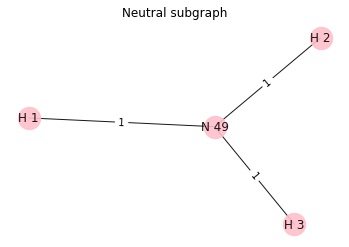

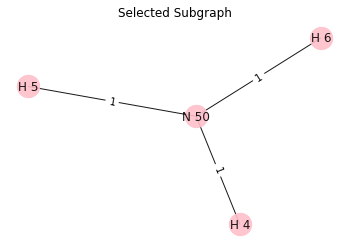

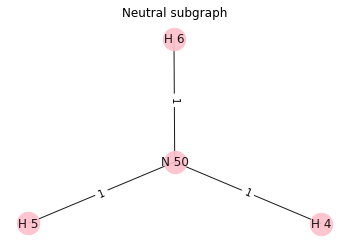

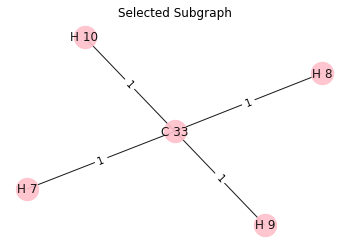

...

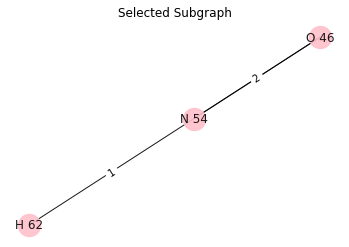

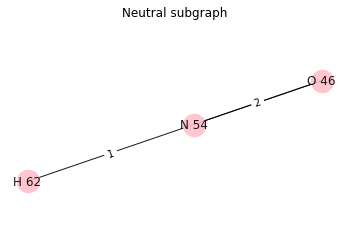

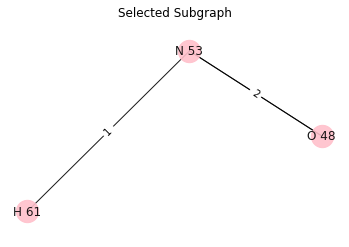

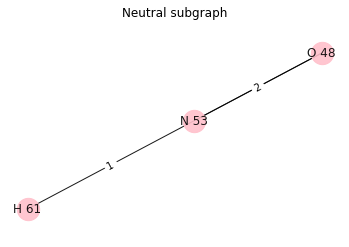

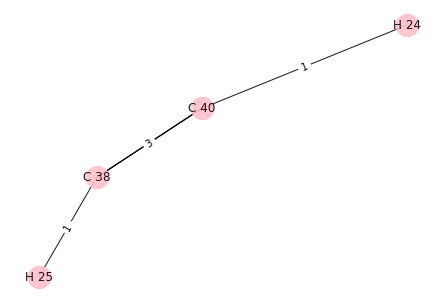

Enter G value of [C 38, H 25, H 24, C 40]: 77.76569152


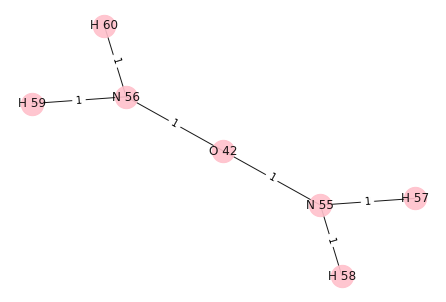

Enter G value of [H 59, H 58, N 55, H 60, H 57, N 56, O 42]: -82.96872


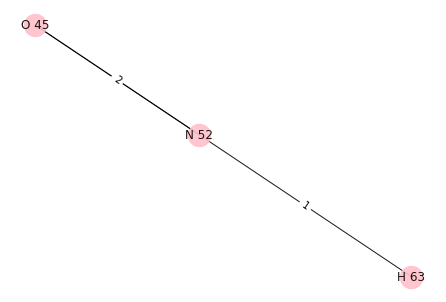

Enter G value of [O 45, N 52, H 63]: -55.40205694
Trail: 0
Executed: 0


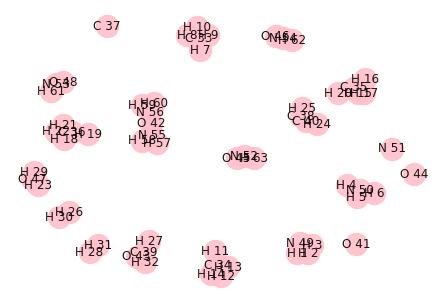

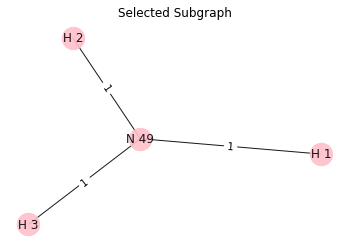

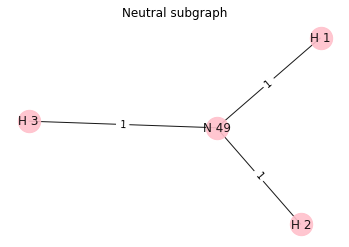

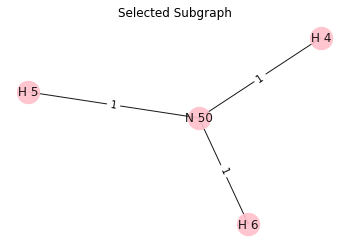

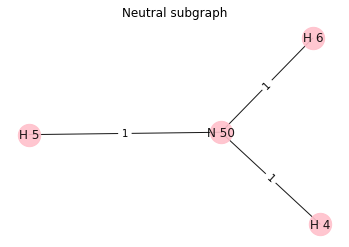

...

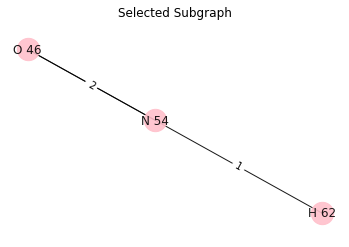

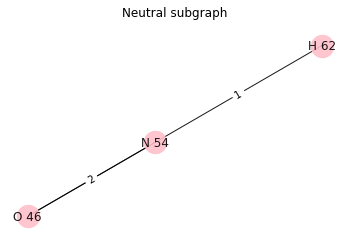

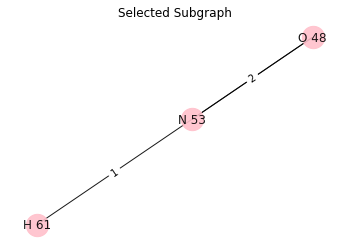

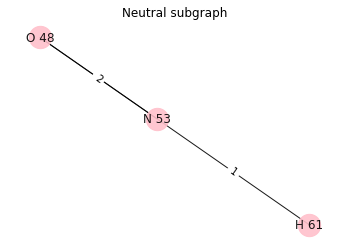

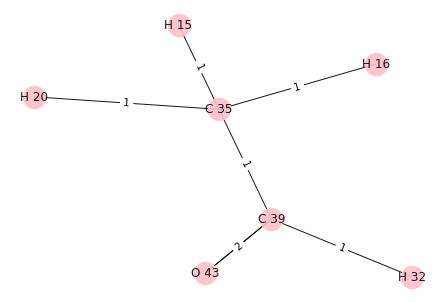

Enter G value of [H 32, H 20, O 43, C 39, C 35, H 15, H 16]: -368.2453749


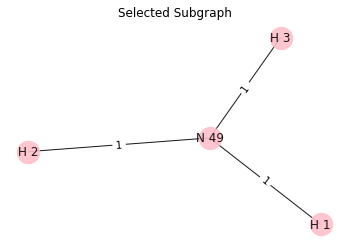

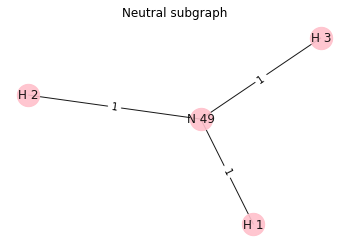

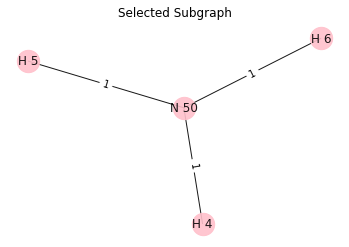

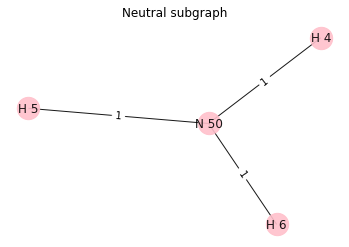

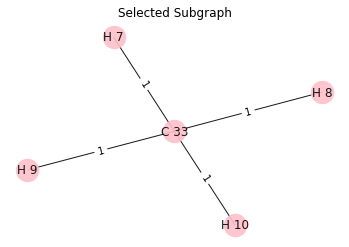

...

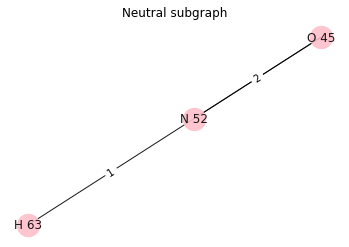

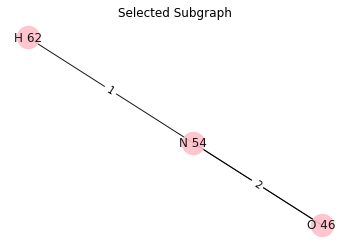

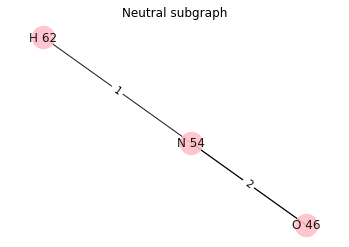

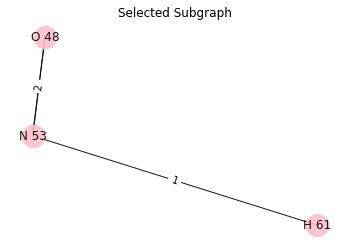

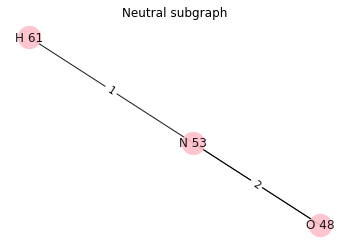

Trail: 1
Executed: 0


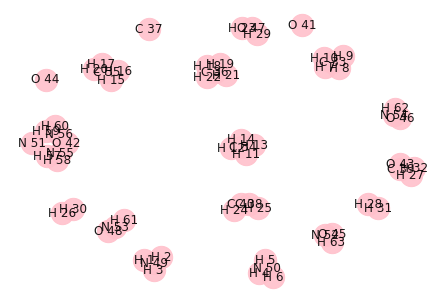

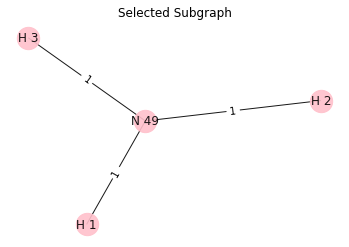

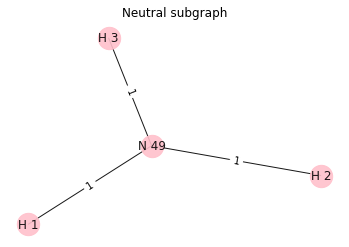

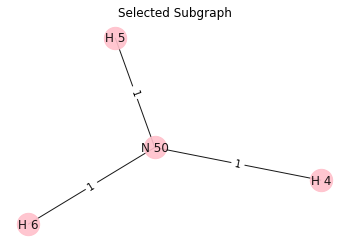

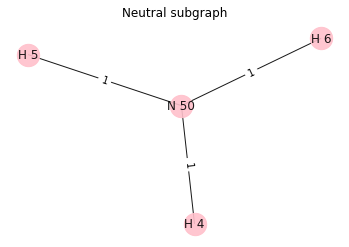

...

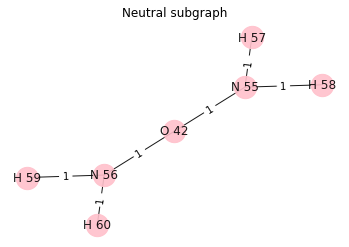

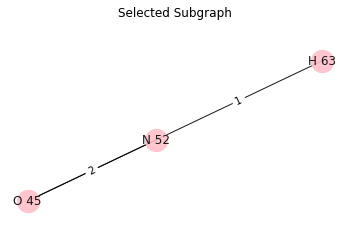

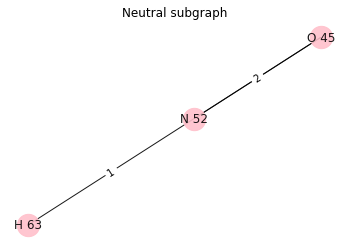

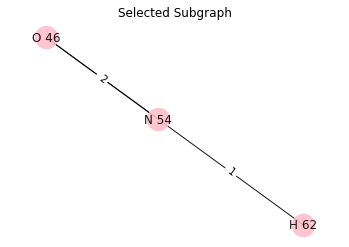

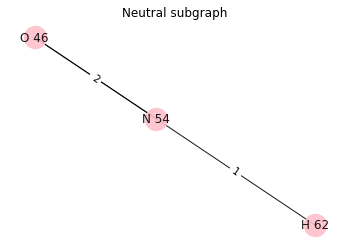

Trail: 2
Executed: 0


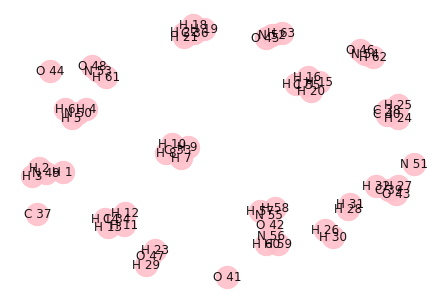

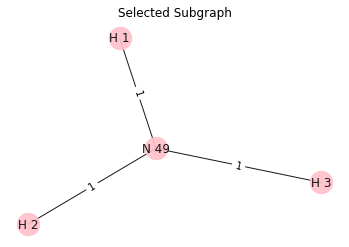

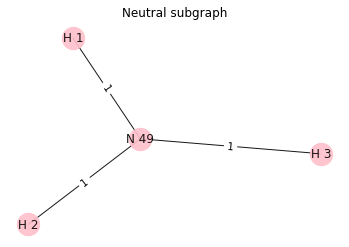

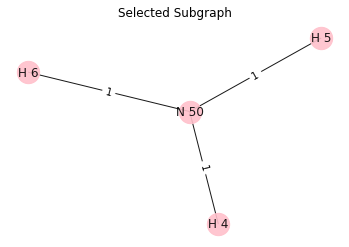

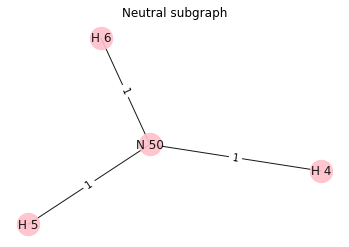

...

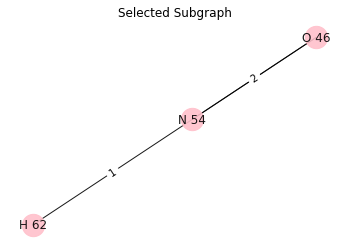

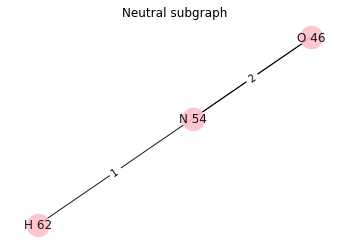

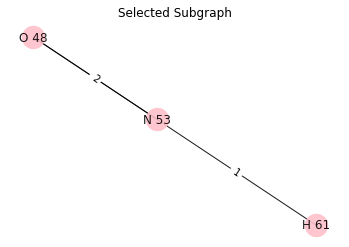

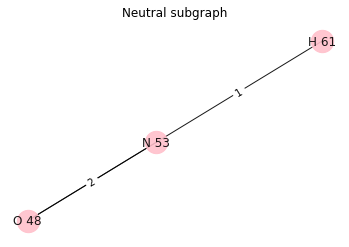

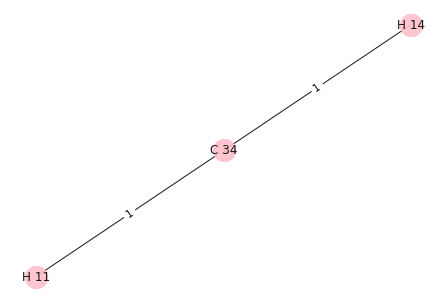

Enter G value of [H 14, H 11, C 34]: -212.8851171


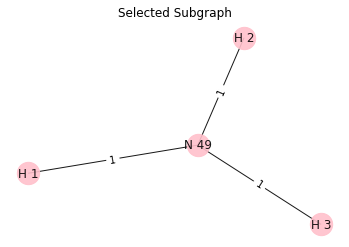

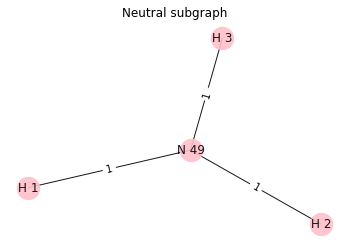

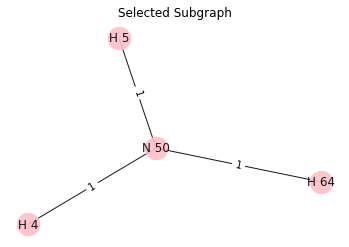

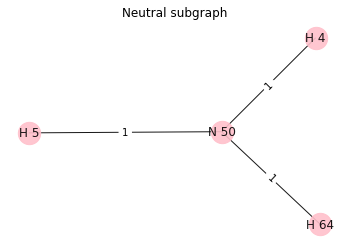

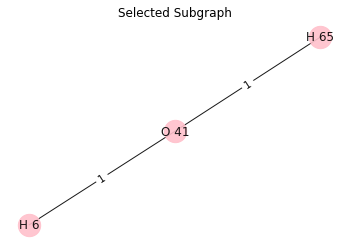

...

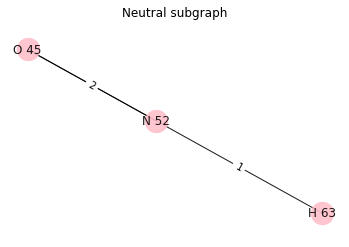

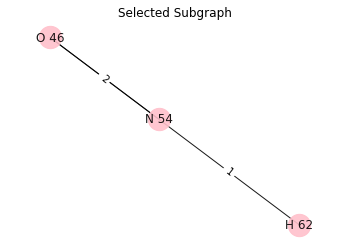

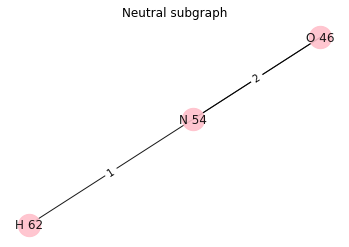

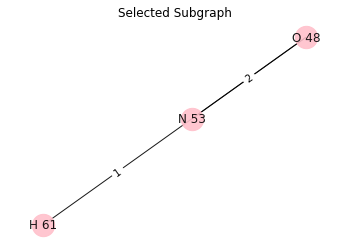

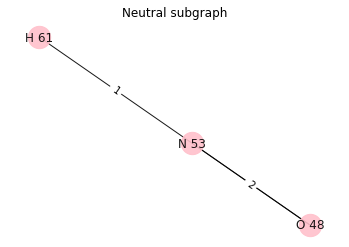

Trail: 3
Executed: 0


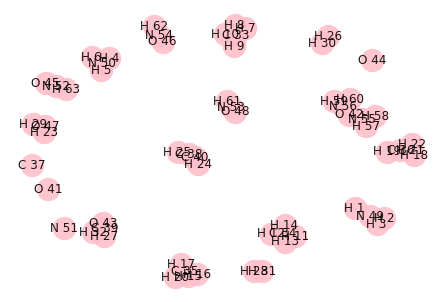

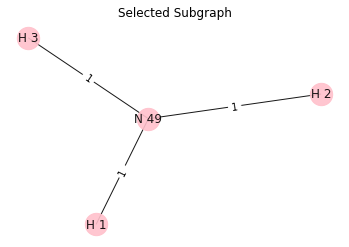

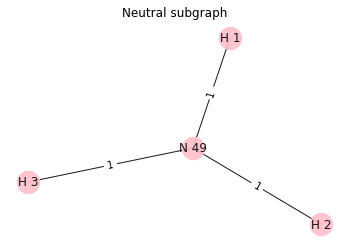

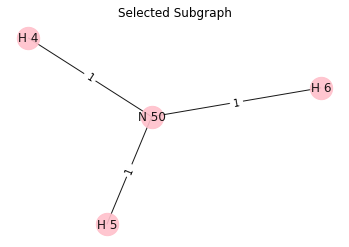

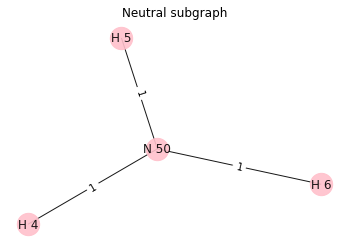

...

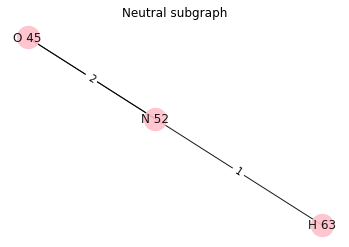

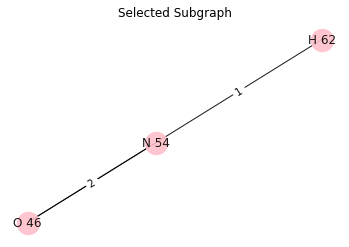

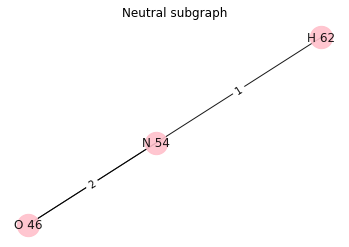

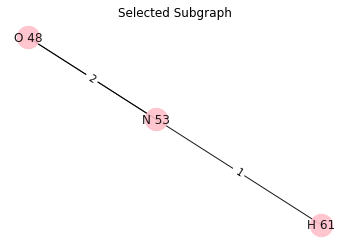

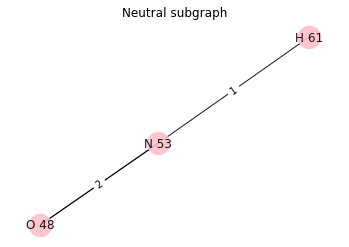

Trail: 4
Executed: 0


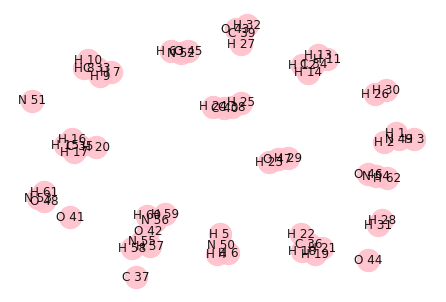

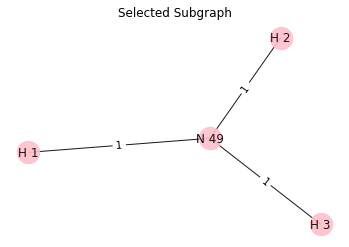

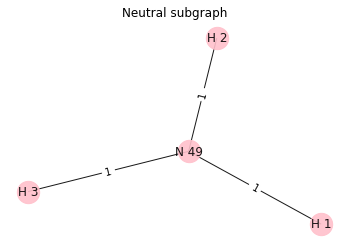

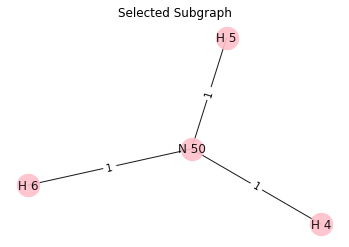

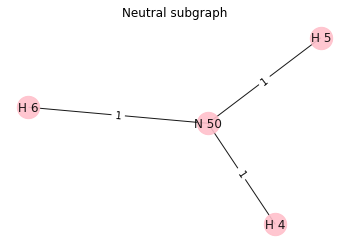

...

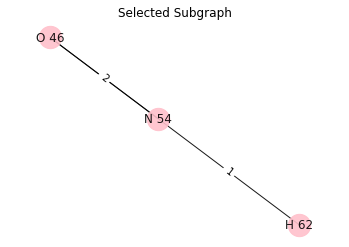

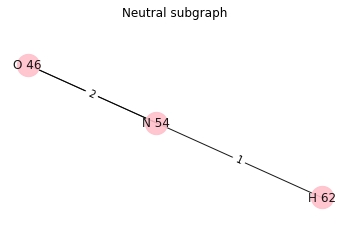

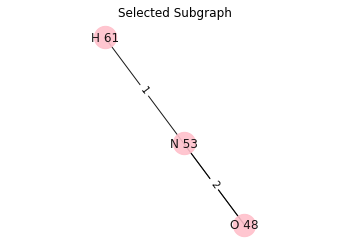

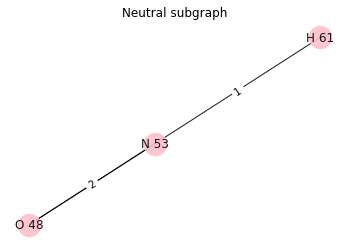

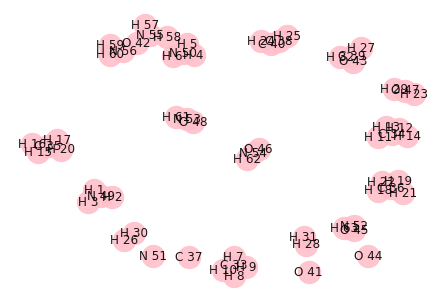

KeyboardInterrupt: 

In [25]:
G_new = G.copy()
trails = 10
T = 10
max_size = 7
G_new = get_neutral_compound(G)
energy = input_G(G_new)
for i in range(trails):
    print("Trail:", i)
    G_new, energy = simulated_annealing(G_new, maximum_edges, energy, i, T, max_size)
    G_new = get_neutral_compound(G_new)
    T *= 0.995